In [ ]:
!pip install gensim
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec
from sklearn.neighbors import KNeighborsClassifier
from scipy.sparse import hstack
import numpy as np
from itertools import combinations
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, recall_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.svm import LinearSVC

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 24.4 MB/s eta 0:00:00


In [ ]:
import pandas as pd
from wordcloud import WordCloud
from collections import Counter
import re
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

df = pd.read_csv(
    "/content/youtube-comments-sentiment.csv",
    encoding="latin1",
    engine="python",
    on_bad_lines="skip"
)

# Data investigation-Project approval

In [ ]:
df

,CommentID,VideoID,VideoTitle,AuthorName,AuthorChannelID,CommentText,Sentiment,Likes,Replies,PublishedAt,CountryCode,CategoryID
0,UgyRjrEdJIPrf68uND14AaABAg,mcY4M9gjtsI,They killed my friend.#tales #movie #shorts,@OneWhoWandered,UC_-UEXaBL1dqqUPGkDll49A,Anyone know what movie this is?,Neutral,0,2,2025-01-15 00:54:55,NZ,1.0
1,UgxXxEIySAwnMNw8D7N4AaABAg,2vuXcw9SZbA,Man Utd conceding first penalty at home in yea...,@chiefvon3068,UCZ1LcZESjYqzaQRhjdZJFwg,The fact they're holding each other back while...,Positive,0,0,2025-01-13 23:51:46,AU,17.0
2,UgxB0jh2Ur41mcXr5IB4AaABAg,papg2tsoFzg,Welcome to Javascript Course,@Abdulla-ip8qr,UCWBK35w5Swy1iF5xIbEyw3A,waiting next video will be?,Neutral,1,0,2020-07-06 13:18:16,IN,27.0
3,UgwMOh95MfK0GuXLLrF4AaABAg,31KTdfRH6nY,Building web applications in Java with Spring ...,@finnianthehuman,UCwQ2Z03nOcMxWozBb_Cv66w,Thanks for the great video.\n\nI don't underst...,Neutral,0,1,2024-09-18 12:04:12,US,27.0
4,UgxJuUe5ysG8OSbABAl4AaABAg,-hV6aeyPHPA,After a new engine her car dies on her way hom...,@ryoutubeplaylistb6137,UCTTcJ0tsAKQokmHB2qVb1qQ,Good person helping good people.\nThis is how ...,Positive,3,1,2025-01-10 19:39:03,US,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...
288717,Ugxyn_Y3pqYMLCBSNEF4AaABAg,C29ugQqjsG8,What do Russians in Estonia think about Putin'...,@PiersDeMann,UCv2vH2vIyMFcP6D4ZkoqV_g,If Russian Estonians are so desperate to live ...,Negative,1,0,2024-06-07 18:17:43,DE,25.0
288718,UgyfQP7NFnq4WfatKUx4AaABAg,zgt5oTD3rRc,Async Javascript fundamentals | chai aur #java...,@WatchNotchK2S,UCIS5bJEEkVkNIippLe4fB5Q,"Once again, the concept thought was in a super...",Positive,0,0,2024-02-23 10:08:27,IN,27.0
288719,UgylrZRespM5EWYlHml4AaABAg,qhtKiLTMC1Y,Donald Trump says he is 'not confident' the Ga...,@GoneFishingAway,UCaGspmOA_EsicWX8POLcKhw,"God, why is this entire comment so depressing?...",Negative,5,12,2025-01-21 17:40:53,GB,25.0
288720,UgwzefHsKGMyujHH0_R4AaABAg,D837fSnO8NA,Mom Accidentally Captures Baby's First Steps ð,@shaheenjehan4898,UCSUtfQRBG-cu8-P70dFlCAg,Awwwwww so sweet â¤â¤â¤â¤â¤â¤â¤â¤ðð...,Positive,10,1,2024-12-31 15:44:25,GB,26.0


In [ ]:
len(df)> 50000 #האם יש מעל ל50000 שורות

True

In [ ]:
df.loc[df["CommentText"].str.split().str.len() > 19]

,CommentID,VideoID,VideoTitle,AuthorName,AuthorChannelID,CommentText,Sentiment,Likes,Replies,PublishedAt,CountryCode,CategoryID
3,UgwMOh95MfK0GuXLLrF4AaABAg,31KTdfRH6nY,Building web applications in Java with Spring ...,@finnianthehuman,UCwQ2Z03nOcMxWozBb_Cv66w,Thanks for the great video.\n\nI don't underst...,Neutral,0,1,2024-09-18 12:04:12,US,27.0
8,UgwzYX76p4RK8AHVcYN4AaABAg,yUImrnDqGUk,Thank god this angel found this beautiful dog ...,@cassiegerst6123,UC-QvE5-ZberkWmSYDXLvfQA,Very similar thing happened to me! We lived ne...,Positive,0,0,2025-01-14 03:54:19,AU,15.0
10,UgyqrXh3SW_NpUqyc_Z4AaABAg,eWRfhZUzrAc,Python for Beginners â Full Course [Programm...,@t.a-8469,UCELGbox9iW4QjIJF37s9E-Q,This is really valuable information and I appr...,Neutral,1,0,2024-02-01 07:16:35,US,27.0
14,UgxYiI99I_RJYsj6lZZ4AaABAg,8oH7-aHrgRI,BREAKING: KAMALA MAKES BEST POSSIBLE VP PICK!,@HoneyBeeCrafts,UCMqxHQS51O7dCOnAsiE7RsQ,Yeah I just found out heâs the best pick bec...,Neutral,0,0,2024-08-07 20:11:42,US,25.0
15,Ugw_yJFIh0N-qbvQNJR4AaABAg,9oSXy1wVPmE,Addi is pretty but SALISH !!ð Jordan Matter...,@pasta3267,UCzBW6qydYqYLFVPzwWFo8gQ,"Salish is amazing but so is Addie, a girl does...",Neutral,1,0,2025-01-12 06:27:32,AU,17.0
...,...,...,...,...,...,...,...,...,...,...,...,...
288699,UgyWjMOf90qR42aUKsd4AaABAg_aug,X7hDBhd_L5U,Datatype conversion confusion | chai aur #java...,AugmentedUser,AugmentedCID,"Sir, I have a question. Do we always need to g...",Negative,0,0,2025-02-02 12:03:39,IN,27.0
288706,UgwPAw87jZSyn_BuKO54AaABAg_aug,3xq-q6a9tCM,Socialist Tells Ben Shapiro: Workers Should Ow...,AugmentedUser,AugmentedCID,Now that a college degree is practically requi...,Neutral,0,0,2025-02-05 11:03:09,US,25.0
288711,UgzjJZV9Zrnio9neNKJ4AaABAg,x7tLPhnA06w,CSS Grid Tutorial #1 - Why Use CSS Grid?,@PexelDesign,UC6oaHCGCdPW-NRIwJwE_GAw,Hi dear friend\r\nI have a question and I hope...,Neutral,1,0,2019-01-13 08:24:26,GB,27.0
288712,UgwoSm3q3_d_wwWOfRR4AaABAg,p15xzjzR9j0,Mastering Python - Everything You Need To Know...,@KayderimGameplays,UCSl6rdnHLNGfQU6_P2tzRwg,"Hello Tim, are there any new features for pyth...",Neutral,0,1,2023-02-13 01:11:20,US,27.0


היסטוגרמה שמטרתה להראות גרפית כמה פעמים יש כל רגש מכלל התגובות

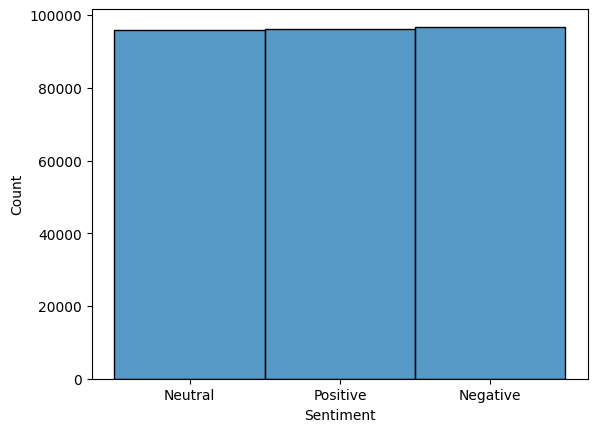

In [ ]:
sns.histplot(x=df["Sentiment"])
plt.show()

כעת להראות זאת כמותית

In [ ]:
df["Sentiment"].value_counts()

,count
Sentiment,
Negative,96795
Positive,96107
Neutral,95820


In [ ]:
for i in df:
  print(df[i].value_counts()) # לולאה שעוברת על כל העמודות דבאטה להראות כמה סוגי ערכים יש בכל עמודה וכמה פעמים הם מופיעים

CommentID
UgwPHgkhfu8nfCE40_V4AaABAg    2
Ugyvr4Gnnfa_fl2pqG94AaABAg    2
Ugw1vj0juH1B7vpyZ1p4AaABAg    2
UgxCu_mAlxOa2Sh18dZ4AaABAg    2
UgxXfP7C5ncJGmKOmFF4AaABAg    2
                             ..
Ugz9janJl3lsv4mXby94AaABAg    1
Ugynb0cx1u8nJBeR6wt4AaABAg    1
UgxIvXZtWXGFLoziRBx4AaABAg    1
Ugy4EC1vPlhhEToN1YJ4AaABAg    1
UgzupSnz3rEzlxvpVU14AaABAg    1
Name: count, Length: 288692, dtype: int64
VideoID
0gASceRnltg    351
Lzccd-ol1Ks    335
-hV6aeyPHPA    312
zUUHdx1oa0s    287
_GVb7c8e0OA    276
              ... 
P-OAIn_eGpI      2
YGstFjI5wzc      1
bbanTh2CoAY      1
t4LrLdDmB3g      1
_jIDVFh-aYI      1
Name: count, Length: 4560, dtype: int64
VideoTitle
Whale Vomit Is Worth Millions ð³                                                                        351
A man saved a mountain lion and raise it with love                                                        335
After a new engine her car dies on her way home makes me think the worst! ð±#fyp #mobile #love #help    31

הפיכת עמודת התאריך לשני עמודות ברורות יותר, עמודת השנה ועמודת החודש


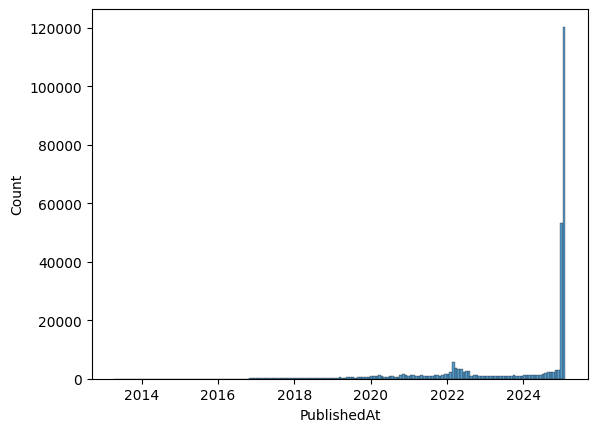

In [ ]:
df["PublishedAt"] = pd.to_datetime(df["PublishedAt"], errors="coerce")
df["Year"] = df["PublishedAt"].dt.year
df["Month"] = df["PublishedAt"].dt.month
sns.histplot(x=df["PublishedAt"]) #הצגה גרפית של העמודה
plt.show()

עשיית קורלציה בין משתנים מספריים, עלול לעזור למצוא התאמות למטרות סיווג הרגש.

<Axes: >

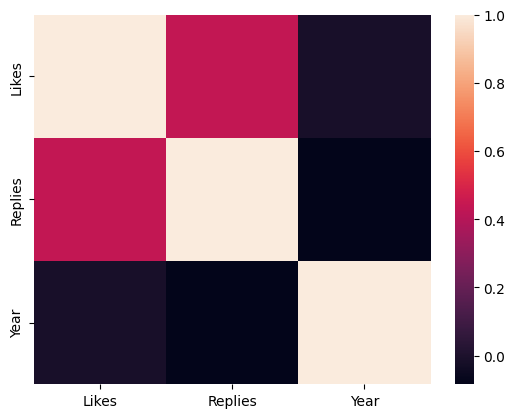

In [ ]:
correlation_matrix = df.drop(columns=["Month","CategoryID"]).select_dtypes(include=['number']).corr()
sns.heatmap(correlation_matrix) #קורלציה לעמודות המספריות מלבד עמודת החודש ועמודת המספר הקטגורי
#יותר בהיר זה כאשר יש יותר התאמה
#יותר כהה זה כאשר יש פחות התאמה

In [ ]:
print(df.VideoTitle.iloc[6]) #הדפסת השורה השביעית(מתחיל מ0) בעמודה כותרת הסרטון

Which one will you choose to use the cola keycap?#keyboard


In [ ]:
df

,CommentID,VideoID,VideoTitle,AuthorName,AuthorChannelID,CommentText,Sentiment,Likes,Replies,PublishedAt,CountryCode,CategoryID,Year,Month
0,UgyRjrEdJIPrf68uND14AaABAg,mcY4M9gjtsI,They killed my friend.#tales #movie #shorts,@OneWhoWandered,UC_-UEXaBL1dqqUPGkDll49A,Anyone know what movie this is?,Neutral,0,2,2025-01-15 00:54:55,NZ,1.0,2025.0,1.0
1,UgxXxEIySAwnMNw8D7N4AaABAg,2vuXcw9SZbA,Man Utd conceding first penalty at home in yea...,@chiefvon3068,UCZ1LcZESjYqzaQRhjdZJFwg,The fact they're holding each other back while...,Positive,0,0,2025-01-13 23:51:46,AU,17.0,2025.0,1.0
2,UgxB0jh2Ur41mcXr5IB4AaABAg,papg2tsoFzg,Welcome to Javascript Course,@Abdulla-ip8qr,UCWBK35w5Swy1iF5xIbEyw3A,waiting next video will be?,Neutral,1,0,2020-07-06 13:18:16,IN,27.0,2020.0,7.0
3,UgwMOh95MfK0GuXLLrF4AaABAg,31KTdfRH6nY,Building web applications in Java with Spring ...,@finnianthehuman,UCwQ2Z03nOcMxWozBb_Cv66w,Thanks for the great video.\n\nI don't underst...,Neutral,0,1,2024-09-18 12:04:12,US,27.0,2024.0,9.0
4,UgxJuUe5ysG8OSbABAl4AaABAg,-hV6aeyPHPA,After a new engine her car dies on her way hom...,@ryoutubeplaylistb6137,UCTTcJ0tsAKQokmHB2qVb1qQ,Good person helping good people.\nThis is how ...,Positive,3,1,2025-01-10 19:39:03,US,2.0,2025.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
288717,Ugxyn_Y3pqYMLCBSNEF4AaABAg,C29ugQqjsG8,What do Russians in Estonia think about Putin'...,@PiersDeMann,UCv2vH2vIyMFcP6D4ZkoqV_g,If Russian Estonians are so desperate to live ...,Negative,1,0,2024-06-07 18:17:43,DE,25.0,2024.0,6.0
288718,UgyfQP7NFnq4WfatKUx4AaABAg,zgt5oTD3rRc,Async Javascript fundamentals | chai aur #java...,@WatchNotchK2S,UCIS5bJEEkVkNIippLe4fB5Q,"Once again, the concept thought was in a super...",Positive,0,0,2024-02-23 10:08:27,IN,27.0,2024.0,2.0
288719,UgylrZRespM5EWYlHml4AaABAg,qhtKiLTMC1Y,Donald Trump says he is 'not confident' the Ga...,@GoneFishingAway,UCaGspmOA_EsicWX8POLcKhw,"God, why is this entire comment so depressing?...",Negative,5,12,2025-01-21 17:40:53,GB,25.0,2025.0,1.0
288720,UgwzefHsKGMyujHH0_R4AaABAg,D837fSnO8NA,Mom Accidentally Captures Baby's First Steps ð,@shaheenjehan4898,UCSUtfQRBG-cu8-P70dFlCAg,Awwwwww so sweet â¤â¤â¤â¤â¤â¤â¤â¤ðð...,Positive,10,1,2024-12-31 15:44:25,GB,26.0,2024.0,12.0


גרף בוקספלוט על עמודת הלייקים, עוזר למציאת חריגים

<Axes: xlabel='Likes'>

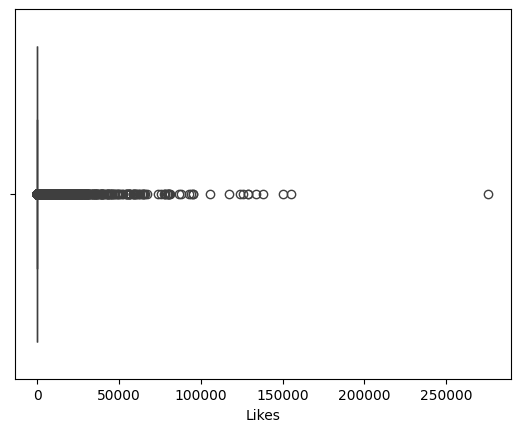

In [ ]:
sns.boxplot(x= df["Likes"]) # לפי הגרף ניתן להסיק שרוב הסרטונים קיבלו כ0 לייקים

In [ ]:
#df.loc[df["Likes"]> 100000] #מדפיס רק את השורות בהן מספר הלייקים גדול מ-100000

In [ ]:
#df['CommentText'].iloc[37365] #הדפסת השורה ה37366

הפיכת העמודה קטגוריה למילים ותיאורים

In [ ]:
import pandas as pd
category_map = {
    1: "Film & Animation",
    2: "Autos & Vehicles",
    10: "Music",
    15: "Pets & Animals",
    17: "Sports",
    19: "Travel & Events",
    20: "Gaming",
    22: "People & Blogs",
    23: "Comedy",
    24: "Entertainment",
    25: "News & Politics",
    26: "Howto & Style",
    27: "Education",
    28: "Science & Technology",
    29: "Nonprofits & Activism"
}
df["Category"] = df["CategoryID"].map(category_map)

df.head()


,CommentID,VideoID,VideoTitle,AuthorName,AuthorChannelID,CommentText,Sentiment,Likes,Replies,PublishedAt,CountryCode,CategoryID,Year,Month,Category
0,UgyRjrEdJIPrf68uND14AaABAg,mcY4M9gjtsI,They killed my friend.#tales #movie #shorts,@OneWhoWandered,UC_-UEXaBL1dqqUPGkDll49A,Anyone know what movie this is?,Neutral,0,2,2025-01-15 00:54:55,NZ,1.0,2025.0,1.0,Film & Animation
1,UgxXxEIySAwnMNw8D7N4AaABAg,2vuXcw9SZbA,Man Utd conceding first penalty at home in yea...,@chiefvon3068,UCZ1LcZESjYqzaQRhjdZJFwg,The fact they're holding each other back while...,Positive,0,0,2025-01-13 23:51:46,AU,17.0,2025.0,1.0,Sports
2,UgxB0jh2Ur41mcXr5IB4AaABAg,papg2tsoFzg,Welcome to Javascript Course,@Abdulla-ip8qr,UCWBK35w5Swy1iF5xIbEyw3A,waiting next video will be?,Neutral,1,0,2020-07-06 13:18:16,IN,27.0,2020.0,7.0,Education
3,UgwMOh95MfK0GuXLLrF4AaABAg,31KTdfRH6nY,Building web applications in Java with Spring ...,@finnianthehuman,UCwQ2Z03nOcMxWozBb_Cv66w,Thanks for the great video.\n\nI don't underst...,Neutral,0,1,2024-09-18 12:04:12,US,27.0,2024.0,9.0,Education
4,UgxJuUe5ysG8OSbABAl4AaABAg,-hV6aeyPHPA,After a new engine her car dies on her way hom...,@ryoutubeplaylistb6137,UCTTcJ0tsAKQokmHB2qVb1qQ,Good person helping good people.\nThis is how ...,Positive,3,1,2025-01-10 19:39:03,US,2.0,2025.0,1.0,Autos & Vehicles


הכנת פונקציה שמקבלת שני פרמטרים הראשון, קטע טקסט, השני, כמות המילים שתרצה שיודפס
הפונקציה לוקחת את כמות המילים שהזנת, נניח הזנת 20 אז היא מדפיסה את 20 המילים הכי משומשות בקטע טקסט שהכנסת וכותבת כמה פעמים הם היו

In [ ]:
def print_most_common_words(text,words_num = 40):
  cleaned_text = re.sub(r"http\S+|www\S+", "", text)
  cleaned_text = re.sub(r"[^a-zA-Z\s]", "", cleaned_text)
  cleaned_text = cleaned_text.lower()
  words = cleaned_text.split()
  stopwords = {"the", "and", "to", "a", "of", "is", "it", "in", "i", "that", "this", "for", "on", "you", "with", "was", "are", "not", "have", "be", "but", "at", "as", "so", "we", "they", "from", "or", "an"}
  filtered_words = [w for w in words if w not in stopwords]
  word_counts = Counter(filtered_words)
  most_common = word_counts.most_common(40)
  for word, count in most_common:
    print(f"{word}: {count}")

In [ ]:
positive_comments = df.loc[df["Sentiment"] == "Positive"] # הכנת תת_דאטה שמורכבת רק משורות שהתגובות בהן חיוהיות


In [ ]:
positive_text = " ".join(positive_comments["CommentText"].astype(str)) # יצירת קטע טקסט שמורכב רק מתגובות חיוביות
positive_text

'The fact they\'re holding each other back while equally being most aggressive ð\x9f\x98\x82ð\x9f\x98\x82 Good person helping good people.\nThis is how it is in America with the exception of NY and DC. Number two because it looks the best with it Thank God we donâ\x80\x99t have to listen to his drivel anymore Very similar thing happened to me! We lived near a beach that had a stray dog. We would all leave food out for her. One day on my morning walk, I noticed she was near an empty tide pool, empty as in had no water and it was quite steep, when she saw me ran over, she kept looking at the tide pool whining. I went over and noticed a little of puppies. There were seagulls and pelicans around and although the puppies werenâ\x80\x99t hers, she knew they werenâ\x80\x99t safe. So I stayed with her and the puppies, helping to fend off the sea birds until the mother came back from what I assume was hunting due to the blood on her mouth. That day I ended up adopting two stray dogs and a litte

הכנת פונקציה שהקלט שלה הוא קטע טקסט והיא פולטת ענן מילים מתוך הטקסט(ככל שהמילה מופיע יותר כך היא יותר גדולה גרפית)

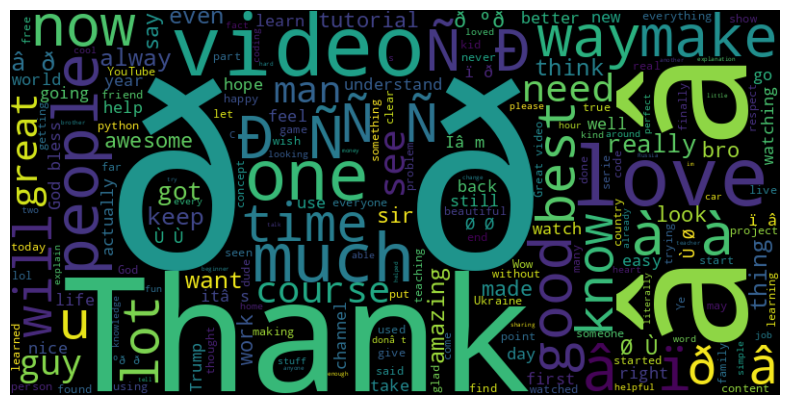

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def make_word_cloud(text):
  wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text)
  plt.figure(figsize=(10, 5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.show()
make_word_cloud(positive_text) # שימוש בפונקציה על הקטע טקסט שמורכב מתגובות חיוביות


In [ ]:
print_most_common_words(positive_text,40) # שימוש בפונקציה שהוכנה קודם

your: 12031
my: 11930
thank: 10565
love: 8110
me: 8045
video: 7853
like: 7474
all: 7356
thanks: 7253
he: 7101
just: 6900
great: 6583
much: 6326
very: 6067
its: 5812
good: 5770
one: 5598
im: 5371
what: 5288
best: 5139
can: 5066
if: 4890
really: 4653
how: 4652
will: 4652
more: 4580
people: 4395
sir: 4389
up: 4375
about: 4253
when: 4067
his: 4043
do: 3988
time: 3917
now: 3702
way: 3557
out: 3485
am: 3462
man: 3439
course: 3410


In [ ]:
negative_comments = df.loc[df["Sentiment"] == "Negative"] # הכנת תת-דאטה שומרכבת רק משורות שהתגובות בהן היו שליליות

In [ ]:
len(positive_comments) # בדיקה כמה שורות כאילו יש

96107

In [ ]:
negative_text = " ".join(negative_comments["CommentText"].astype(str)) # הכנת קטע טקסט שמורכב רק ממילים שליליות


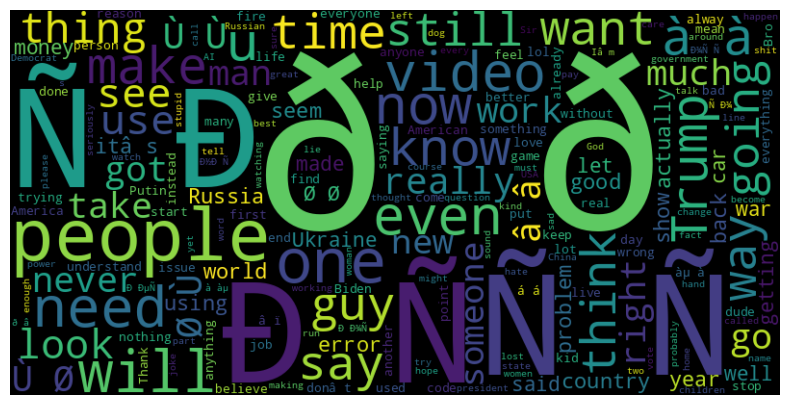

In [ ]:
make_word_cloud(negative_text) #הכנת ענן מילים מהקטע טקסט השלילי

In [ ]:
print_most_common_words(negative_text,100) # בדיקת המילים הכי משומשות וכמותם לפי הפונקציה

he: 12026
its: 11233
just: 9413
all: 9004
like: 8997
if: 8822
what: 8578
my: 8162
people: 7975
no: 7867
your: 7246
how: 6920
when: 6863
dont: 6546
will: 6509
do: 6398
his: 6272
can: 6234
about: 6208
why: 6117
me: 6097
im: 6047
get: 5559
their: 5489
would: 5327
has: 5234
who: 5131
one: 5120
out: 4976
up: 4836
by: 4792
there: 4663
she: 4560
more: 4557
should: 4452
even: 4438
them: 4406
because: 4381
him: 3939
these: 3933


In [ ]:
neutral_comments = df.loc[df["Sentiment"] == "Neutral"] # הדפסת תת-דאטה שמורכבת רק מתגובות ניטרליות

In [ ]:
neutral_text = " ".join(neutral_comments["CommentText"].astype(str)) # הכנת קטע טקסט שמורכב רק מתגובות נטרליות

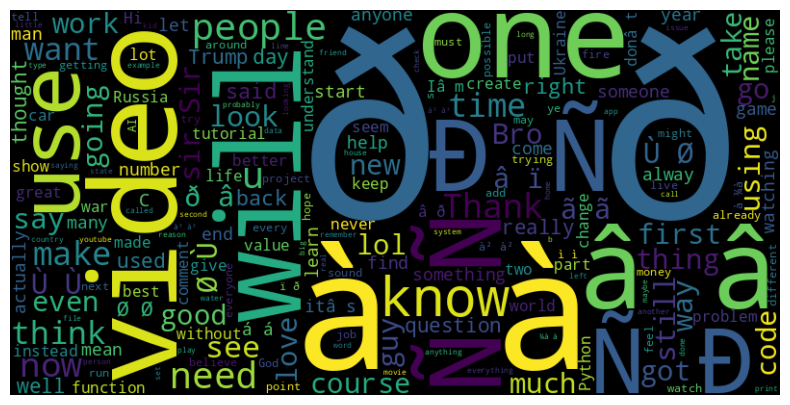

In [ ]:
make_word_cloud(neutral_text) # ענן מילים מקטע טקסט שמורכב מתגובות ניטרליות

הצגה גרפית של כמה סוגי תגובות היו בממוצע בכל ז'אנר

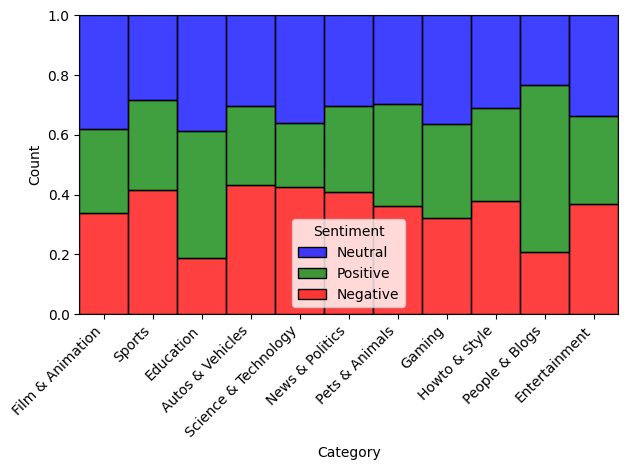

In [ ]:
sns.histplot(x=df["Category"],hue = df["Sentiment"],multiple="fill",palette={"Positive": "green", "Negative": "red","Neutral": "blue"})
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

הצגה גרפית של כמה סוגי תגובות היו בממוצע בכל שנה

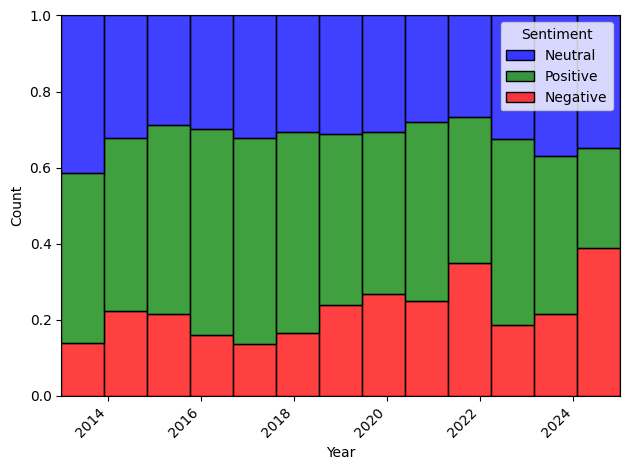

In [ ]:
sns.histplot(x=df["Year"], hue=df["Sentiment"], multiple="fill", bins=13,palette={"Positive": "green", "Negative": "red","Neutral": "blue"})
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

הצגה גרפית של כמה סוגי תגובות היו בממוצע בכל חודש

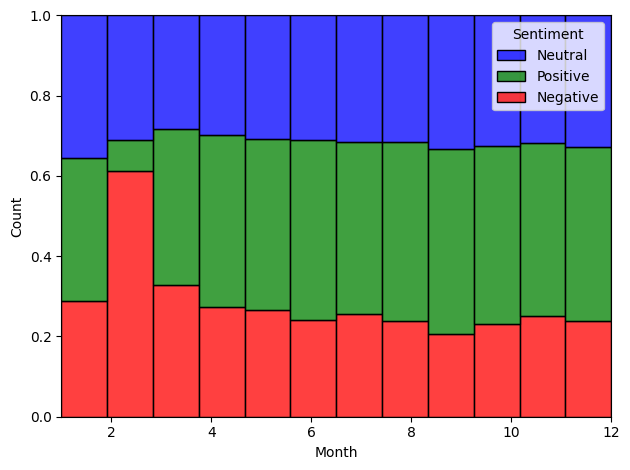

In [ ]:
sns.histplot(x=df["Month"], hue=df["Sentiment"], multiple="fill", bins=12,palette={"Positive": "green", "Negative": "red","Neutral": "blue"})
plt.tight_layout()
plt.show()

# EDA process

In [ ]:
df_clean = df.drop(columns =['CommentID', 'VideoID',"AuthorName", 'VideoTitle', 'AuthorChannelID','PublishedAt','CategoryID', 'CommentText'])

In [ ]:
df

,CommentID,VideoID,VideoTitle,AuthorName,AuthorChannelID,CommentText,Sentiment,Likes,Replies,PublishedAt,CountryCode,CategoryID,Year,Month,Category
0,UgyRjrEdJIPrf68uND14AaABAg,mcY4M9gjtsI,They killed my friend.#tales #movie #shorts,@OneWhoWandered,UC_-UEXaBL1dqqUPGkDll49A,Anyone know what movie this is?,Neutral,0,2,2025-01-15 00:54:55,NZ,1.0,2025.0,1.0,Film & Animation
1,UgxXxEIySAwnMNw8D7N4AaABAg,2vuXcw9SZbA,Man Utd conceding first penalty at home in yea...,@chiefvon3068,UCZ1LcZESjYqzaQRhjdZJFwg,The fact they're holding each other back while...,Positive,0,0,2025-01-13 23:51:46,AU,17.0,2025.0,1.0,Sports
2,UgxB0jh2Ur41mcXr5IB4AaABAg,papg2tsoFzg,Welcome to Javascript Course,@Abdulla-ip8qr,UCWBK35w5Swy1iF5xIbEyw3A,waiting next video will be?,Neutral,1,0,2020-07-06 13:18:16,IN,27.0,2020.0,7.0,Education
3,UgwMOh95MfK0GuXLLrF4AaABAg,31KTdfRH6nY,Building web applications in Java with Spring ...,@finnianthehuman,UCwQ2Z03nOcMxWozBb_Cv66w,Thanks for the great video.\n\nI don't underst...,Neutral,0,1,2024-09-18 12:04:12,US,27.0,2024.0,9.0,Education
4,UgxJuUe5ysG8OSbABAl4AaABAg,-hV6aeyPHPA,After a new engine her car dies on her way hom...,@ryoutubeplaylistb6137,UCTTcJ0tsAKQokmHB2qVb1qQ,Good person helping good people.\nThis is how ...,Positive,3,1,2025-01-10 19:39:03,US,2.0,2025.0,1.0,Autos & Vehicles
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
288717,Ugxyn_Y3pqYMLCBSNEF4AaABAg,C29ugQqjsG8,What do Russians in Estonia think about Putin'...,@PiersDeMann,UCv2vH2vIyMFcP6D4ZkoqV_g,If Russian Estonians are so desperate to live ...,Negative,1,0,2024-06-07 18:17:43,DE,25.0,2024.0,6.0,News & Politics
288718,UgyfQP7NFnq4WfatKUx4AaABAg,zgt5oTD3rRc,Async Javascript fundamentals | chai aur #java...,@WatchNotchK2S,UCIS5bJEEkVkNIippLe4fB5Q,"Once again, the concept thought was in a super...",Positive,0,0,2024-02-23 10:08:27,IN,27.0,2024.0,2.0,Education
288719,UgylrZRespM5EWYlHml4AaABAg,qhtKiLTMC1Y,Donald Trump says he is 'not confident' the Ga...,@GoneFishingAway,UCaGspmOA_EsicWX8POLcKhw,"God, why is this entire comment so depressing?...",Negative,5,12,2025-01-21 17:40:53,GB,25.0,2025.0,1.0,News & Politics
288720,UgwzefHsKGMyujHH0_R4AaABAg,D837fSnO8NA,Mom Accidentally Captures Baby's First Steps ð,@shaheenjehan4898,UCSUtfQRBG-cu8-P70dFlCAg,Awwwwww so sweet â¤â¤â¤â¤â¤â¤â¤â¤ðð...,Positive,10,1,2024-12-31 15:44:25,GB,26.0,2024.0,12.0,Howto & Style


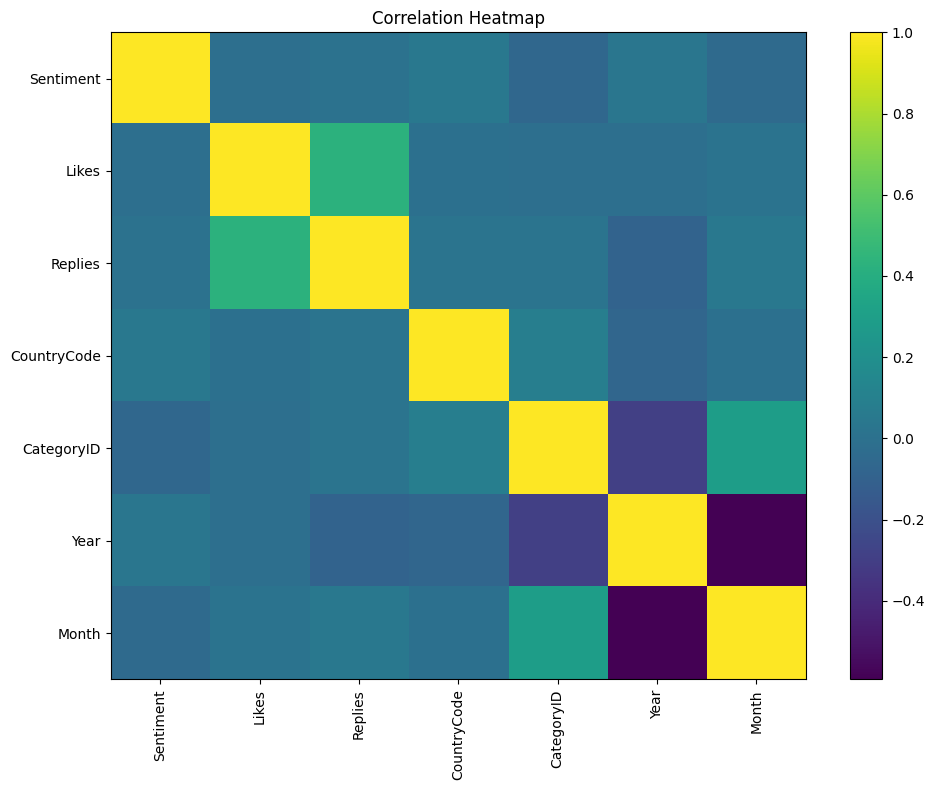

In [ ]:
new_df = df.copy()
for col in ['Sentiment', 'CountryCode']:
  new_df[col], _ = pd.factorize(new_df[col])
numeric_df = new_df.select_dtypes(include=['float64', 'int64', 'int32'])
corr = numeric_df.corr()
plt.figure(figsize=(10, 8))
plt.imshow(corr, aspect='auto')
plt.colorbar()
plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
plt.yticks(range(len(corr.columns)), corr.columns)
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()


לאחר שסידרתי את הדאטה ובדקתי מה שהיינו צריכים וקיבלנו אישור, אפשר להתחיל את תהליך חקירת הדאטה, וסידורה לעומקה

## preparation

In [ ]:
eda_df = df.drop(columns =['CommentID', 'VideoID',"AuthorName", 'VideoTitle', 'AuthorChannelID','PublishedAt','CategoryID']) # זריקת העמודות הלא רלוונטיות להליך

In [ ]:
eda_df # הדאטה שנעבוד איתה במהלך התהליך

,CommentText,Sentiment,Likes,Replies,CountryCode,Year,Month,Category
0,Anyone know what movie this is?,Neutral,0,2,NZ,2025.0,1.0,Film & Animation
1,The fact they're holding each other back while...,Positive,0,0,AU,2025.0,1.0,Sports
2,waiting next video will be?,Neutral,1,0,IN,2020.0,7.0,Education
3,Thanks for the great video.\n\nI don't underst...,Neutral,0,1,US,2024.0,9.0,Education
4,Good person helping good people.\nThis is how ...,Positive,3,1,US,2025.0,1.0,Autos & Vehicles
...,...,...,...,...,...,...,...,...
288717,If Russian Estonians are so desperate to live ...,Negative,1,0,DE,2024.0,6.0,News & Politics
288718,"Once again, the concept thought was in a super...",Positive,0,0,IN,2024.0,2.0,Education
288719,"God, why is this entire comment so depressing?...",Negative,5,12,GB,2025.0,1.0,News & Politics
288720,Awwwwww so sweet â¤â¤â¤â¤â¤â¤â¤â¤ðð...,Positive,10,1,GB,2024.0,12.0,Howto & Style


In [ ]:
eda_df.isnull().sum() # בדיקה כמה ערכים חסרים יש

,0
CommentText,0
Sentiment,0
Likes,0
Replies,0
CountryCode,1
Year,1
Month,1
Category,1


In [ ]:
eda_df = eda_df.dropna()
eda_df

,CommentText,Sentiment,Likes,Replies,CountryCode,Year,Month,Category
0,Anyone know what movie this is?,Neutral,0,2,NZ,2025.0,1.0,Film & Animation
1,The fact they're holding each other back while...,Positive,0,0,AU,2025.0,1.0,Sports
2,waiting next video will be?,Neutral,1,0,IN,2020.0,7.0,Education
3,Thanks for the great video.\n\nI don't underst...,Neutral,0,1,US,2024.0,9.0,Education
4,Good person helping good people.\nThis is how ...,Positive,3,1,US,2025.0,1.0,Autos & Vehicles
...,...,...,...,...,...,...,...,...
288716,American arrogance isnt limited to the Trump f...,Negative,1,0,CA,2025.0,1.0,News & Politics
288717,If Russian Estonians are so desperate to live ...,Negative,1,0,DE,2024.0,6.0,News & Politics
288718,"Once again, the concept thought was in a super...",Positive,0,0,IN,2024.0,2.0,Education
288719,"God, why is this entire comment so depressing?...",Negative,5,12,GB,2025.0,1.0,News & Politics


In [ ]:
df.columns # בדיקה כמה עמודות יש

Index(['CommentID', 'VideoID', 'VideoTitle', 'AuthorName', 'AuthorChannelID',
       'CommentText', 'Sentiment', 'Likes', 'Replies', 'PublishedAt',
       'CountryCode', 'CategoryID', 'Year', 'Month', 'Category'],
      dtype='object')

הכנת תת דאטה שמורכבת מעמודות שדורשות את התהליך

הכנת פונקציה שמבצעת את התהליך באופן אוטומטי(יוצר הפונקציה: אורי, יישר כוח עצום)

In [ ]:
def eda_on_column(df, column_name): #קלט: הדאטה, ושם העמודה שבדאטה
  print("EDA for column: " +column_name) # הדפסת שם העמודה

  print("\n[INFO]")
  print(df[[column_name]].info()) #חקירה מקוצרת באמצעות מתודת אינפו
  print("\n[INFO]")
  print("\n[Missing values]")
  print(df[column_name].isnull().sum())

  col_data = df[column_name] # בידוד העמודה ושמירתה באמצעות שם משתנה כללי

  if pd.api.types.is_numeric_dtype(col_data):
    print("The column is numerical")
    print("\n[DESCRIBE]")
    print(col_data.describe())

    plt.figure(figsize=(6, 3))
    sns.boxplot(x=col_data)
    plt.title(f"Boxplot of {column_name}")
    plt.show()

  else:
    print("The column is categorical")
    print("\n[VALUE COUNTS]")
    print(col_data.value_counts().head(10))

    plt.figure(figsize=(8, 4))
    sns.countplot(y=col_data, order=col_data.value_counts().index)
    plt.title(f"Countplot of {column_name}")
    plt.tight_layout()
    plt.show()

## Features

### Feature - 'Sentiment'

EDA for column: Sentiment

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Sentiment  288721 non-null  object
dtypes: object(1)
memory usage: 4.4+ MB
None

[INFO]

[Missing values]
0
The column is categorical

[VALUE COUNTS]
Sentiment
Negative    96795
Positive    96107
Neutral     95819
Name: count, dtype: int64


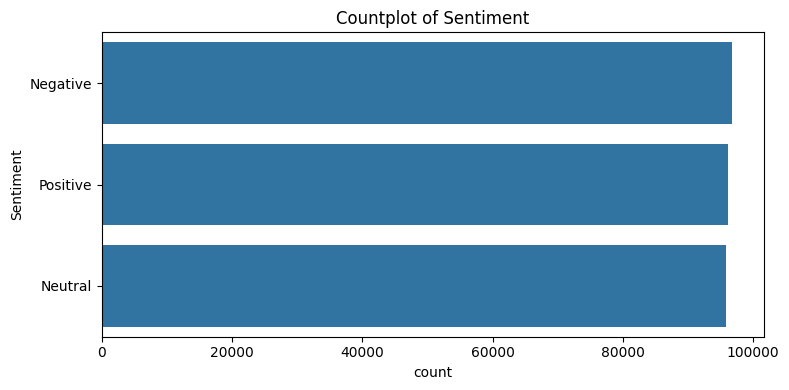

In [ ]:
eda_on_column(eda_df, "Sentiment")

### Feature - 'Replies'

EDA for column: Replies

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column   Non-Null Count   Dtype
---  ------   --------------   -----
 0   Replies  288721 non-null  int64
dtypes: int64(1)
memory usage: 4.4 MB
None

[INFO]

[Missing values]
0
The column is numerical

[DESCRIBE]
count    288721.000000
mean          2.000817
std          13.773288
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max         751.000000
Name: Replies, dtype: float64


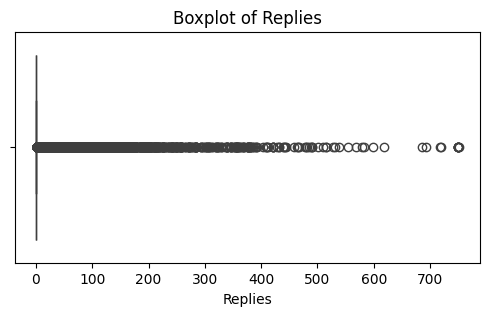

In [ ]:
eda_on_column(eda_df, "Replies")

<Axes: xlabel='Replies', ylabel='Count'>

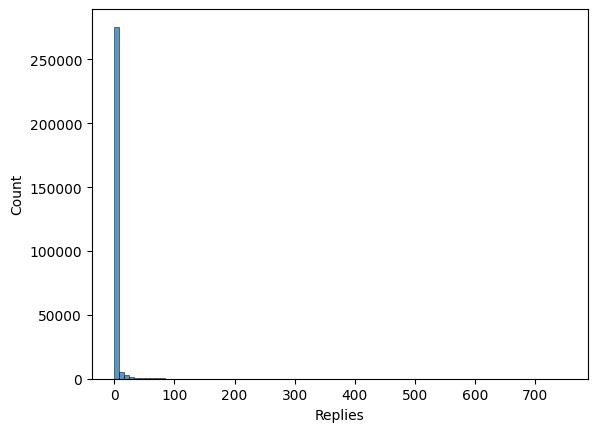

In [ ]:
sns.histplot(data=eda_df,x="Replies",bins=90 )

In [ ]:
eda_df.Replies.value_counts()

,count
Replies,
0,237027
1,17544
2,7258
3,4220
4,2936
...,...
324,1
464,1
531,1


### Feature - 'CountryCode'

EDA for column: CountryCode

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   CountryCode  288721 non-null  object
dtypes: object(1)
memory usage: 4.4+ MB
None

[INFO]

[Missing values]
0
The column is categorical

[VALUE COUNTS]
CountryCode
US    89801
AU    39570
GB    36704
IN    33868
CA    33041
IE    20492
NZ    19762
DE    10611
PH     4872
Name: count, dtype: int64


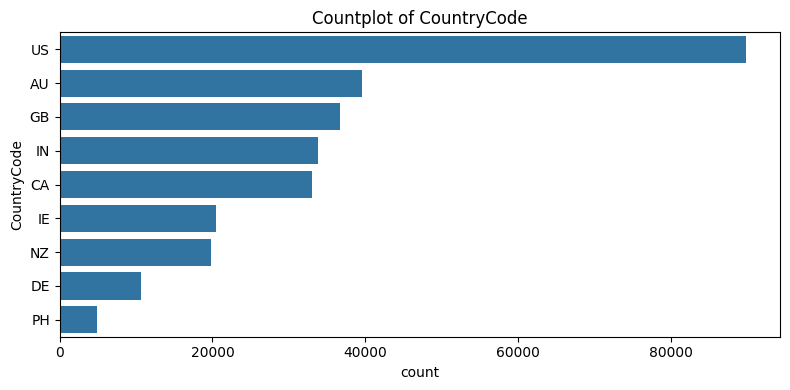

In [ ]:
eda_on_column(eda_df, "CountryCode")

### Feature - 'Year'

EDA for column: Year

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Year    288721 non-null  float64
dtypes: float64(1)
memory usage: 4.4 MB
None

[INFO]

[Missing values]
0
The column is numerical

[DESCRIBE]
count    288721.000000
mean       2023.688339
std           1.968327
min        2013.000000
25%        2022.000000
50%        2025.000000
75%        2025.000000
max        2025.000000
Name: Year, dtype: float64


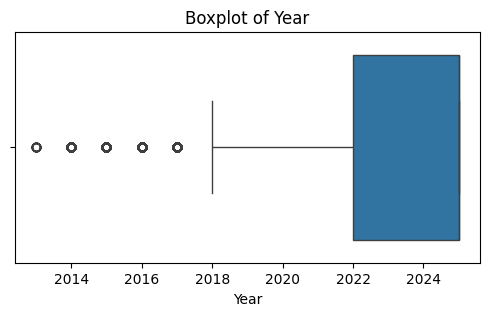

In [ ]:
eda_on_column(eda_df, "Year")

### Feature - 'Month'

EDA for column: Month

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Month   288721 non-null  float64
dtypes: float64(1)
memory usage: 4.4 MB
None

[INFO]

[Missing values]
0
The column is numerical

[DESCRIBE]
count    288721.000000
mean          3.455079
std           3.486488
min           1.000000
25%           1.000000
50%           2.000000
75%           5.000000
max          12.000000
Name: Month, dtype: float64


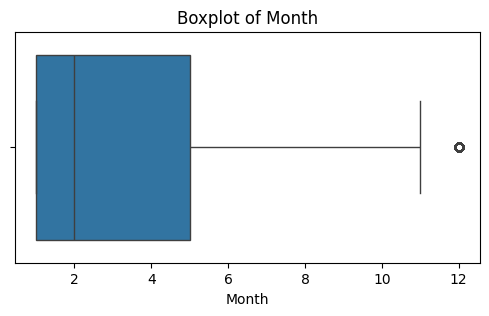

In [ ]:
eda_on_column(eda_df, "Month")

### Feature - 'Category'

EDA for column: Category

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   Category  288721 non-null  object
dtypes: object(1)
memory usage: 4.4+ MB
None

[INFO]

[Missing values]
0
The column is categorical

[VALUE COUNTS]
Category
News & Politics         93582
Education               81153
Howto & Style           23926
Sports                  19101
Pets & Animals          13866
Entertainment           13576
Science & Technology    13394
Autos & Vehicles        12337
Gaming                   8858
People & Blogs           4956
Name: count, dtype: int64


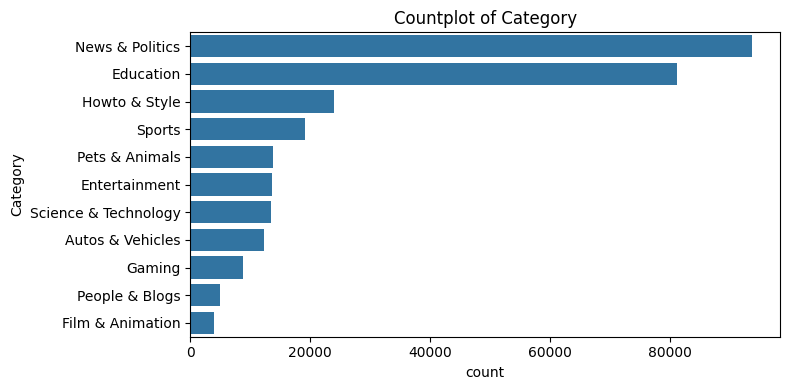

In [ ]:
eda_on_column(eda_df, "Category")

## Correlations

### פונקציות חשובות לקשרים בין מחלקות

In [ ]:
def anova_test(numeric, categorical):
    groups = [numeric[categorical == cat] for cat in categorical.unique()]

    f_stat, p_value = stats.f_oneway(*groups)
    return {"F-statistic": f_stat, "p-value": p_value}

In [ ]:
def sentiment_month_plot(df, col1, col2):
    count_df = df.groupby([col1, col2]).size().reset_index(name='Count')
    count_df['Relative'] = count_df.groupby(col1)['Count'].transform(lambda x: x / x.sum())
    # Updated color_map to use numerical keys based on factorized Sentiment
    color_map = {
        0: 'blue',  # Neutral
        1: 'green', # Positive
        2: 'red'    # Negative
    }
    plt.figure(figsize=(12, 6))
    plt.xticks(rotation=45, ha='right')
    sns.barplot(
        data=count_df,
        x=col1,
        y='Relative',
        hue=col2,
        palette=color_map
    )
    plt.title("Relative Sentiment Distribution Per " + col1)
    plt.ylabel("Relative Frequency (0–1)")
    plt.tight_layout()
    plt.show()

In [ ]:
eda_df2 = eda_df.copy()
eda_df2['Sentiment'], _ = pd.factorize(eda_df2['Sentiment'])
eda_df2

,CommentText,Sentiment,Likes,Replies,CountryCode,Year,Month,Category
0,Anyone know what movie this is?,0,0,2,NZ,2025.0,1.0,Film & Animation
1,The fact they're holding each other back while...,1,0,0,AU,2025.0,1.0,Sports
2,waiting next video will be?,0,1,0,IN,2020.0,7.0,Education
3,Thanks for the great video.\n\nI don't underst...,0,0,1,US,2024.0,9.0,Education
4,Good person helping good people.\nThis is how ...,1,3,1,US,2025.0,1.0,Autos & Vehicles
...,...,...,...,...,...,...,...,...
288716,American arrogance isnt limited to the Trump f...,2,1,0,CA,2025.0,1.0,News & Politics
288717,If Russian Estonians are so desperate to live ...,2,1,0,DE,2024.0,6.0,News & Politics
288718,"Once again, the concept thought was in a super...",1,0,0,IN,2024.0,2.0,Education
288719,"God, why is this entire comment so depressing?...",2,5,12,GB,2025.0,1.0,News & Politics


###קשר בין Sentiment לLikes

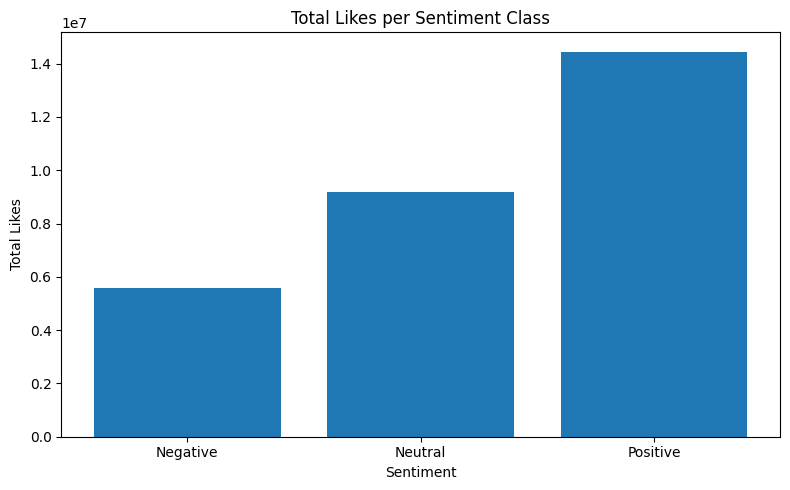

In [ ]:
likes_sum = eda_df.groupby("Sentiment")["Likes"].sum().reset_index()

plt.figure(figsize=(8, 5))
plt.bar(likes_sum["Sentiment"], likes_sum["Likes"])
plt.title("Total Likes per Sentiment Class")
plt.xlabel("Sentiment")
plt.ylabel("Total Likes")
plt.tight_layout()
plt.show()

### קשר בין sentiment לreplies

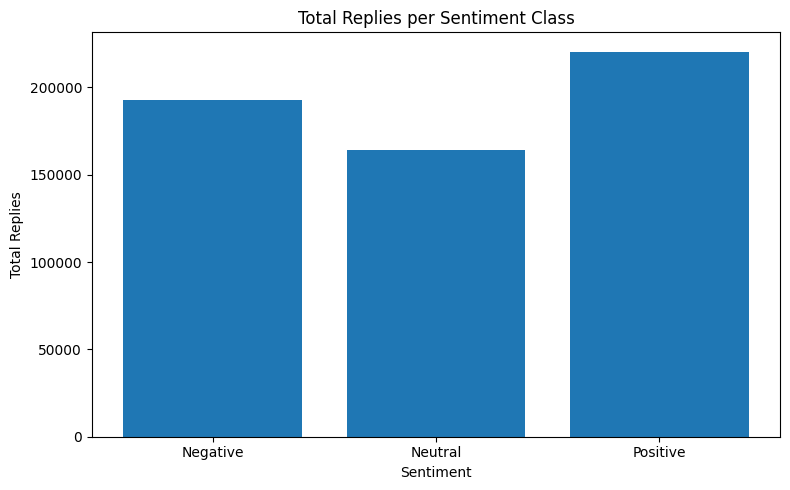

In [ ]:
Replies_sum = eda_df.groupby("Sentiment")["Replies"].sum().reset_index()

plt.figure(figsize=(8, 5))
plt.bar(Replies_sum["Sentiment"], Replies_sum["Replies"])
plt.title("Total Replies per Sentiment Class")
plt.xlabel("Sentiment")
plt.ylabel("Total Replies")
plt.tight_layout()
plt.show()

In [ ]:
anova_test(eda_df["Replies"], eda_df["Sentiment"])

{'F-statistic': np.float64(42.589341494557),
 'p-value': np.float64(3.2093116393520434e-19)}

### הקשר בין Month לSentiment

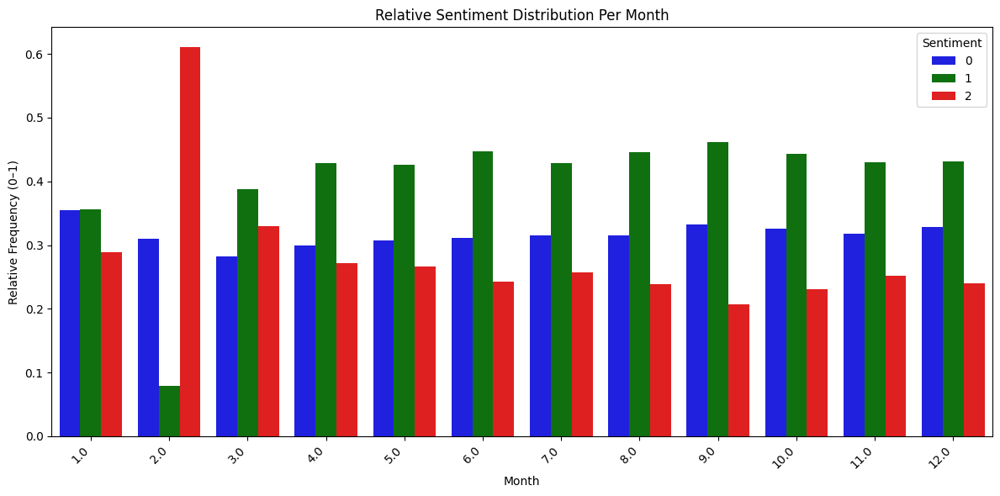

In [ ]:
sentiment_month_plot(eda_df2,'Month', 'Sentiment' )

### הקשר בין Year לSentiment

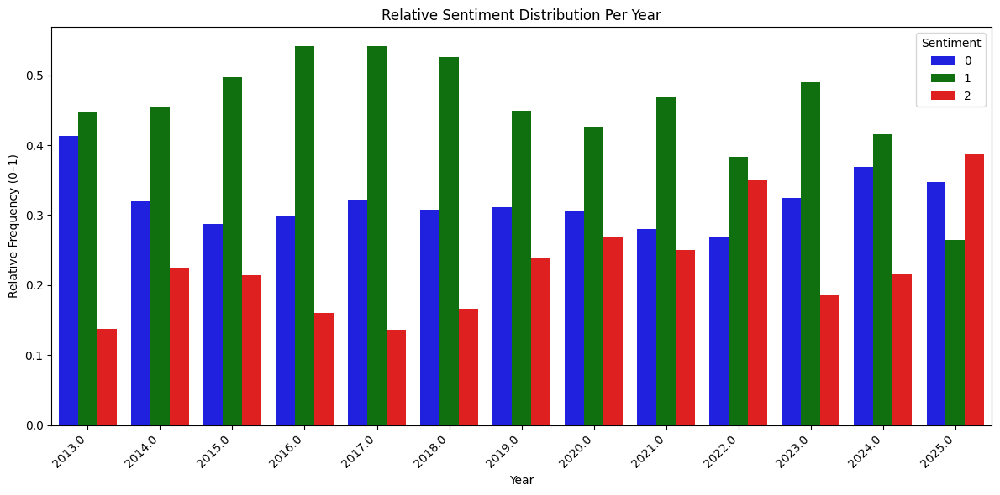

In [ ]:
sentiment_month_plot(eda_df2,'Year', 'Sentiment' )

### הקשר בין CountryCode לsentiment

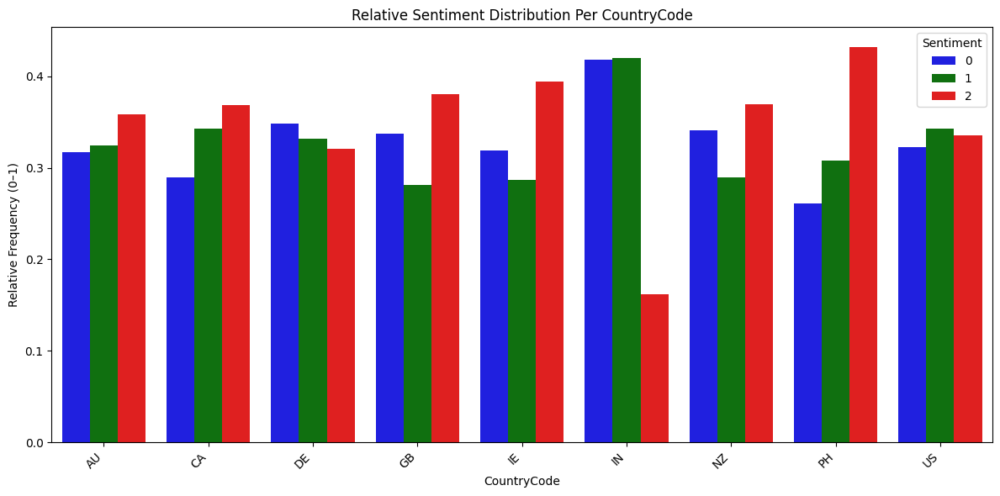

In [ ]:
sentiment_month_plot(eda_df2,'CountryCode', 'Sentiment' )

### הקשר בין Category לsentiment

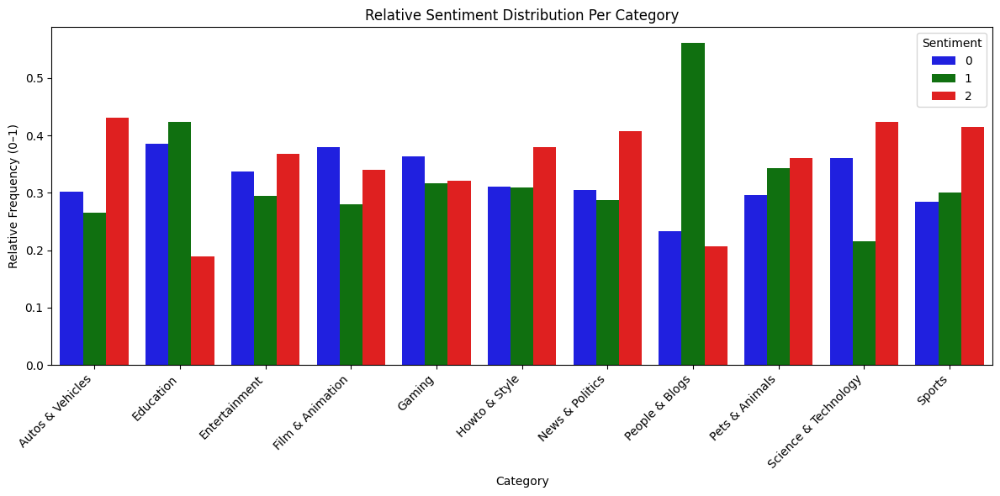

In [ ]:
sentiment_month_plot(eda_df2,'Category', 'Sentiment' )

### הקשר בין Category CountryCode

In [ ]:
ct = pd.crosstab(eda_df['Category'], eda_df['CountryCode'])

<Axes: xlabel='CountryCode', ylabel='Category'>

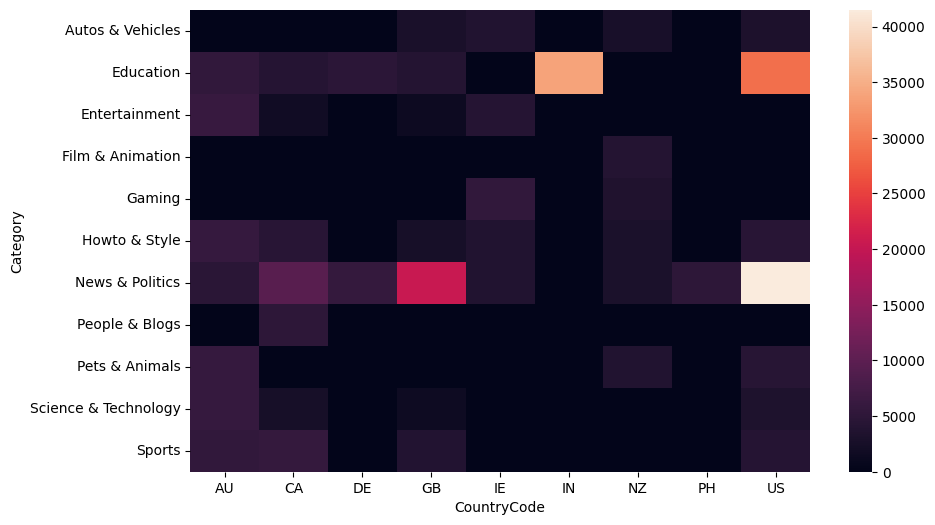

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(ct)

### הקשר בין likes  replies

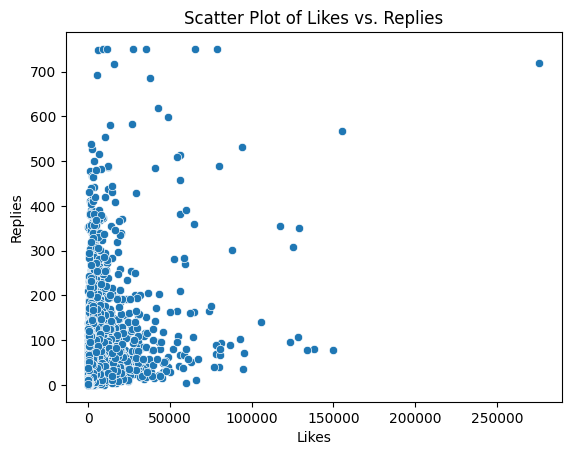

In [ ]:
sns.scatterplot(data=eda_df, x='Likes', y='Replies')
plt.title('Scatter Plot of Likes vs. Replies')
plt.xlabel('Likes')
plt.ylabel('Replies')
plt.show()

### הקשר בין Year  CountryCode

In [ ]:
ct = pd.crosstab(eda_df['Year'], eda_df['CountryCode'])

In [ ]:
eda_df

,CommentText,Sentiment,Likes,Replies,CountryCode,Year,Month,Category
0,Anyone know what movie this is?,Neutral,0,2,NZ,2025.0,1.0,Film & Animation
1,The fact they're holding each other back while...,Positive,0,0,AU,2025.0,1.0,Sports
2,waiting next video will be?,Neutral,1,0,IN,2020.0,7.0,Education
3,Thanks for the great video.\n\nI don't underst...,Neutral,0,1,US,2024.0,9.0,Education
4,Good person helping good people.\nThis is how ...,Positive,3,1,US,2025.0,1.0,Autos & Vehicles
...,...,...,...,...,...,...,...,...
288716,American arrogance isnt limited to the Trump f...,Negative,1,0,CA,2025.0,1.0,News & Politics
288717,If Russian Estonians are so desperate to live ...,Negative,1,0,DE,2024.0,6.0,News & Politics
288718,"Once again, the concept thought was in a super...",Positive,0,0,IN,2024.0,2.0,Education
288719,"God, why is this entire comment so depressing?...",Negative,5,12,GB,2025.0,1.0,News & Politics


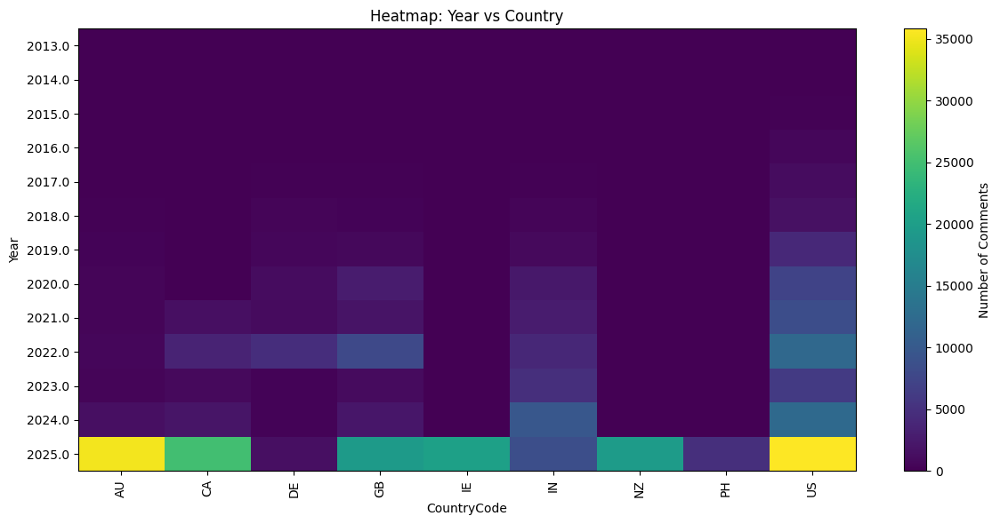

In [ ]:
plt.figure(figsize=(12, 6))
plt.imshow(ct, aspect='auto')
plt.title('Heatmap: Year vs Country')
plt.xlabel('CountryCode')
plt.ylabel('Year')
plt.xticks(ticks=range(len(ct.columns)), labels=ct.columns, rotation=90)
plt.yticks(ticks=range(len(ct.index)), labels=ct.index)
plt.colorbar(label='Number of Comments')
plt.tight_layout()
plt.show()

## הנדסת פיצ'רים

In [ ]:
eda_df.columns

Index(['CommentText', 'Sentiment', 'Likes', 'Replies', 'CountryCode', 'Year',
       'Month', 'Category'],
      dtype='object')

In [ ]:
import re

emoji_pattern = re.compile(
    "["
    "\U0001F600-\U0001F64F"
    "\U0001F300-\U0001F5FF"
    "\U0001F680-\U0001F6FF"
    "\U0001F1E0-\U0001F1FF"
    "\U00002700-\U000027BF"
    "\U000024C2-\U0001F251"
    "]+", flags=re.UNICODE
)

def contains_emoji(text):
    return bool(emoji_pattern.search(str(text)))

eda_df['WordsCount'] = eda_df['CommentText'].str.split().str.len()
eda_df['LetterCount'] = eda_df['CommentText'].str.replace(r'[^A-Za-zא-ת]', '', regex=True).str.len()
eda_df['SymbolCount'] = eda_df['CommentText'].str.count(r'[!?]')
eda_df['CapCount'] = eda_df['CommentText'].str.count(r'[A-Z]')
eda_df['IsEmoji'] = eda_df['CommentText'].apply(contains_emoji)
eda_df['SentencesCount'] = eda_df['CommentText'].str.count(r'[.!?]') + 1


/tmp/ipykernel_396/3489109257.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eda_df['WordsCount'] = eda_df['CommentText'].str.split().str.len()
/tmp/ipykernel_396/3489109257.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eda_df['LetterCount'] = eda_df['CommentText'].str.replace(r'[^A-Za-zא-ת]', '', regex=True).str.len()
/tmp/ipykernel_396/3489109257.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value i

In [ ]:
import pandas as pd
import re
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import nltk

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def clean_text(t):
    t = str(t).lower()
    t = re.sub(r'[^\w\s]', ' ', t)
    words = t.split()
    words = [lemmatizer.lemmatize(w) for w in words if w not in stop_words]
    return ' '.join(words)

df['CleanText'] = df['CommentText'].apply(clean_text)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
negative_comments = df.loc[df["Sentiment"] == "Negative"]
negative_comments

,CommentID,VideoID,VideoTitle,AuthorName,AuthorChannelID,CommentText,Sentiment,Likes,Replies,PublishedAt,CountryCode,CategoryID,Year,Month,Category,CleanText
9,UgzW7h-gmtmgIFFClLJ4AaABAg,5VPxcrvVkBc,He betrayed his own friend - Enjoying a cup of...,@josh_playz2709,UCflV1g1fmgs5i2QZwiaHT8g,im about to cryð¢,Negative,0,0,2025-01-13 09:55:03,IE,20.0,2025.0,1.0,Gaming,im cryð
18,UgwbHw5WMjguoAIzlhl4AaABAg,mAr-vlrRJqY,Russian atrocities: Evidence of civilian killi...,@hires4708,UC0w0kge8G2aoffcpisHzLNQ,"@ALinchik, that is what happens when you selec...",Negative,1,0,2022-04-13 09:46:31,DE,25.0,2022.0,4.0,News & Politics,alinchik happens select comedian aleader ukrai...
23,UgxKLZ8TdaATyq2qbs94AaABAg,Jo8DuEHc-SQ,Biker stands up for himself when approached by...,@LetsWinNLife,UCv1gtnktP-rauSDrc0LPmAg,It hurt wen u crossed by a niga u loveð¢,Negative,0,0,2025-01-15 02:17:09,NZ,2.0,2025.0,1.0,Autos & Vehicles,hurt wen u crossed niga u loveð
24,Ugzx9Od7VPIeYpgDUcV4AaABAg,CvyCNm0Qczg,ELON MUSK ATTACKS KYLE!,@RonaldMcDonald-o5z,UCUNQ5F8Delg4F6Sx9dudX5w,356k people now know Elon is a liar. Always h...,Negative,1,0,2024-12-25 19:07:30,US,25.0,2024.0,12.0,News & Politics,356k people know elon liar always good move dipsh
29,UgzFNqBOfmxnMRZkKAl4AaABAg_aug,9AQVwUJOfB4,Homemade PIZZA APPROVED @albert_cancook,AugmentedUser,AugmentedCID,it's not possible,Negative,0,0,2025-02-04 02:29:41,CA,26.0,2025.0,2.0,Howto & Style,possible
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
288704,UgxGqemLbVFywjLjlUZ4AaABAg_aug,WzO5_ZedH-8,MADE IN SWEDEN #routier #camion #volvo,AugmentedUser,AugmentedCID,"It's not even made in Sweden, haha.",Negative,0,0,2025-02-04 03:02:20,IE,2.0,2025.0,2.0,Autos & Vehicles,even made sweden haha
288709,Ugz4uEU-THgJ3J7CJop4AaABAg,B4l7nCZdkuw,Russian war crimes: The end of German illusions?,@Justkillinchillin,UC6L9LdIK8tUry3rbAt2keOg,USA IS EVIL,Negative,0,0,2024-05-26 10:57:41,DE,25.0,2024.0,5.0,News & Politics,usa evil
288716,Ugynz-FAG4CBKrd5GSl4AaABAg,d604itawFLQ,'I think we're good': Canadians react to being...,@bluebelle9370,UCe-04uXFiFMfjtFWz-J-k5g,American arrogance isnt limited to the Trump f...,Negative,1,0,2025-01-10 18:30:54,CA,25.0,2025.0,1.0,News & Politics,american arrogance isnt limited trump family
288717,Ugxyn_Y3pqYMLCBSNEF4AaABAg,C29ugQqjsG8,What do Russians in Estonia think about Putin'...,@PiersDeMann,UCv2vH2vIyMFcP6D4ZkoqV_g,If Russian Estonians are so desperate to live ...,Negative,1,0,2024-06-07 18:17:43,DE,25.0,2024.0,6.0,News & Politics,russian estonian desperate live oppressive dic...


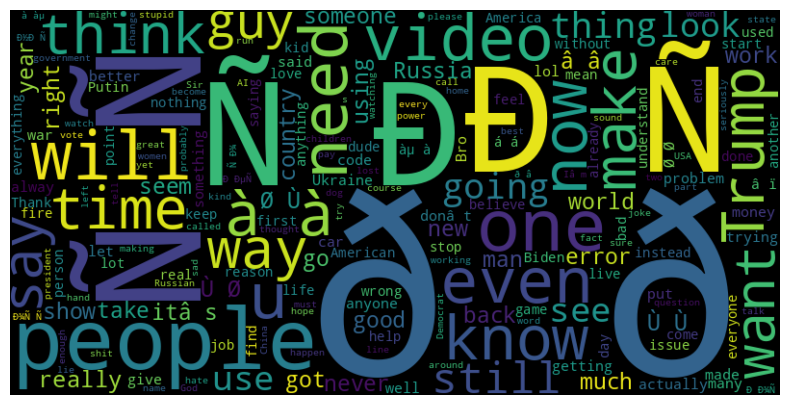

In [ ]:
negative_text = " ".join(negative_comments["CommentText"].astype(str))
make_word_cloud(negative_text) #הכנת ענן מילים מהקטע טקסט המנוקה השלילי

In [ ]:
def count_features(text):
    if pd.isna(text):
        text = ""
    words_count = len(text.split())
    letter_count = 0
    symbol_count = 0
    cap_count = 0
    is_emoji = 0
    sentences_count = 0
    for ch in text:
        if ch.isalpha():
            letter_count += 1
        if ch in "!?" :
            symbol_count += 1
        if ch.isupper():
            cap_count += 1
        if not ch.isalnum() and not ch.isspace():
            if ord(ch) > 1000:
                is_emoji = 1
        if ch in ".!?":
            sentences_count += 1
    return pd.Series([
        words_count,
        letter_count,
        symbol_count,
        cap_count,
        is_emoji,
        sentences_count
    ])

In [ ]:
eda_df[["WordsCount", "LetterCount", "SymbolCount",
    "CapCount", "IsEmoji", "SentencesCount"]] = eda_df['CommentText'].apply(count_features)

/tmp/ipykernel_396/1619706282.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eda_df[["WordsCount", "LetterCount", "SymbolCount",


### New Feature - 'WordsCount'

EDA for column: WordsCount

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column      Non-Null Count   Dtype
---  ------      --------------   -----
 0   WordsCount  288721 non-null  int64
dtypes: int64(1)
memory usage: 4.4 MB
None

[INFO]

[Missing values]
0
The column is numerical

[DESCRIBE]
count    288721.000000
mean         19.193225
std          29.444102
min           0.000000
25%           6.000000
50%          12.000000
75%          22.000000
max        1655.000000
Name: WordsCount, dtype: float64


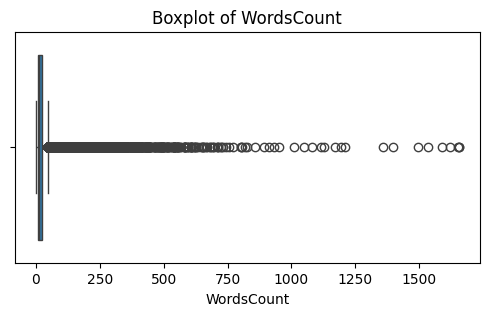

In [ ]:
eda_on_column(eda_df, "WordsCount")

### New Feature - 'LetterCount'

EDA for column: LetterCount

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column       Non-Null Count   Dtype
---  ------       --------------   -----
 0   LetterCount  288721 non-null  int64
dtypes: int64(1)
memory usage: 4.4 MB
None

[INFO]

[Missing values]
0
The column is numerical

[DESCRIBE]
count    288721.000000
mean         83.635129
std         133.806906
min           0.000000
25%          27.000000
50%          51.000000
75%          95.000000
max        8172.000000
Name: LetterCount, dtype: float64


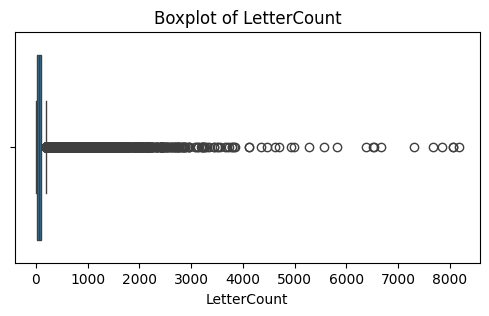

In [ ]:
eda_on_column(eda_df, "LetterCount")

### New Feature - 'SymbolCount'

EDA for column: SymbolCount

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column       Non-Null Count   Dtype
---  ------       --------------   -----
 0   SymbolCount  288721 non-null  int64
dtypes: int64(1)
memory usage: 4.4 MB
None

[INFO]

[Missing values]
0
The column is numerical

[DESCRIBE]
count    288721.000000
mean          0.466582
std           1.980946
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max         715.000000
Name: SymbolCount, dtype: float64


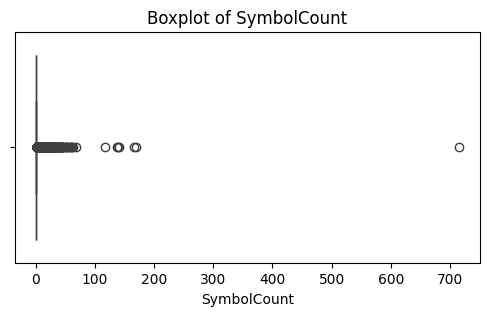

In [ ]:
eda_on_column(eda_df, "SymbolCount")

In [ ]:
eda_df

,CommentText,Sentiment,Likes,Replies,CountryCode,Year,Month,Category,WordsCount,LetterCount,SymbolCount,CapCount,IsEmoji,SentencesCount
0,Anyone know what movie this is?,Neutral,0,2,NZ,2025.0,1.0,Film & Animation,6,25,1,1,0,1
1,The fact they're holding each other back while...,Positive,0,0,AU,2025.0,1.0,Sports,13,66,0,1,0,0
2,waiting next video will be?,Neutral,1,0,IN,2020.0,7.0,Education,5,22,1,0,0,1
3,Thanks for the great video.\n\nI don't underst...,Neutral,0,1,US,2024.0,9.0,Education,91,359,4,14,0,5
4,Good person helping good people.\nThis is how ...,Positive,3,1,US,2025.0,1.0,Autos & Vehicles,19,74,0,7,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
288716,American arrogance isnt limited to the Trump f...,Negative,1,0,CA,2025.0,1.0,News & Politics,8,44,0,2,0,0
288717,If Russian Estonians are so desperate to live ...,Negative,1,0,DE,2024.0,6.0,News & Politics,17,88,1,3,0,1
288718,"Once again, the concept thought was in a super...",Positive,0,0,IN,2024.0,2.0,Education,14,51,0,2,0,1
288719,"God, why is this entire comment so depressing?...",Negative,5,12,GB,2025.0,1.0,News & Politics,35,144,1,5,0,3


### New Feature - 'CapCount'

EDA for column: CapCount

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column    Non-Null Count   Dtype
---  ------    --------------   -----
 0   CapCount  288721 non-null  int64
dtypes: int64(1)
memory usage: 4.4 MB
None

[INFO]

[Missing values]
0
The column is numerical

[DESCRIBE]
count    288721.000000
mean          5.339265
std          26.387450
min           0.000000
25%           1.000000
50%           2.000000
75%           4.000000
max        6488.000000
Name: CapCount, dtype: float64


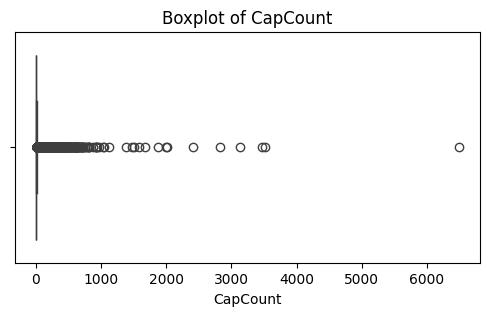

In [ ]:
eda_on_column(eda_df, "CapCount")

### New Feature - 'IsEmoji'

EDA for column: IsEmoji

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column   Non-Null Count   Dtype
---  ------   --------------   -----
 0   IsEmoji  288721 non-null  int64
dtypes: int64(1)
memory usage: 4.4 MB
None

[INFO]

[Missing values]
0
The column is numerical

[DESCRIBE]
count    288721.0
mean          0.0
std           0.0
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           0.0
Name: IsEmoji, dtype: float64


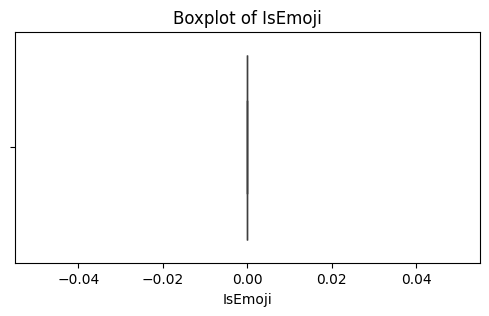

In [ ]:
eda_on_column(eda_df, "IsEmoji")

<Axes: xlabel='IsEmoji', ylabel='count'>

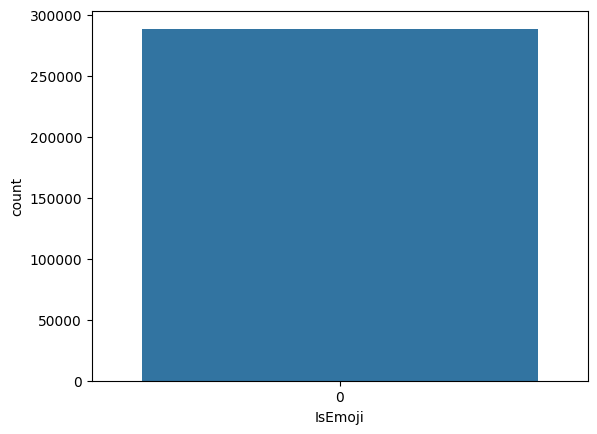

In [ ]:
sns.countplot(data=eda_df,x="IsEmoji")

### New Feature - 'SentencesCount'

EDA for column: SentencesCount

[INFO]
<class 'pandas.core.frame.DataFrame'>
Index: 288721 entries, 0 to 288720
Data columns (total 1 columns):
 #   Column          Non-Null Count   Dtype
---  ------          --------------   -----
 0   SentencesCount  288721 non-null  int64
dtypes: int64(1)
memory usage: 4.4 MB
None

[INFO]

[Missing values]
0
The column is numerical

[DESCRIBE]
count    288721.000000
mean          1.760530
std          18.695893
min           0.000000
25%           0.000000
50%           1.000000
75%           2.000000
max        9855.000000
Name: SentencesCount, dtype: float64


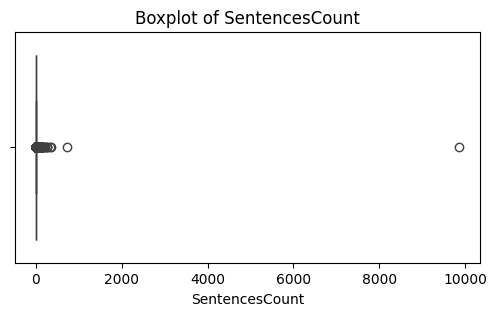

In [ ]:
eda_on_column(eda_df, "SentencesCount")

### השפעות הפיצרים החדשים על הדאטה

/tmp/ipykernel_396/591227237.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eda_df[col], _ = pd.factorize(eda_df[col])
/tmp/ipykernel_396/591227237.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eda_df[col], _ = pd.factorize(eda_df[col])


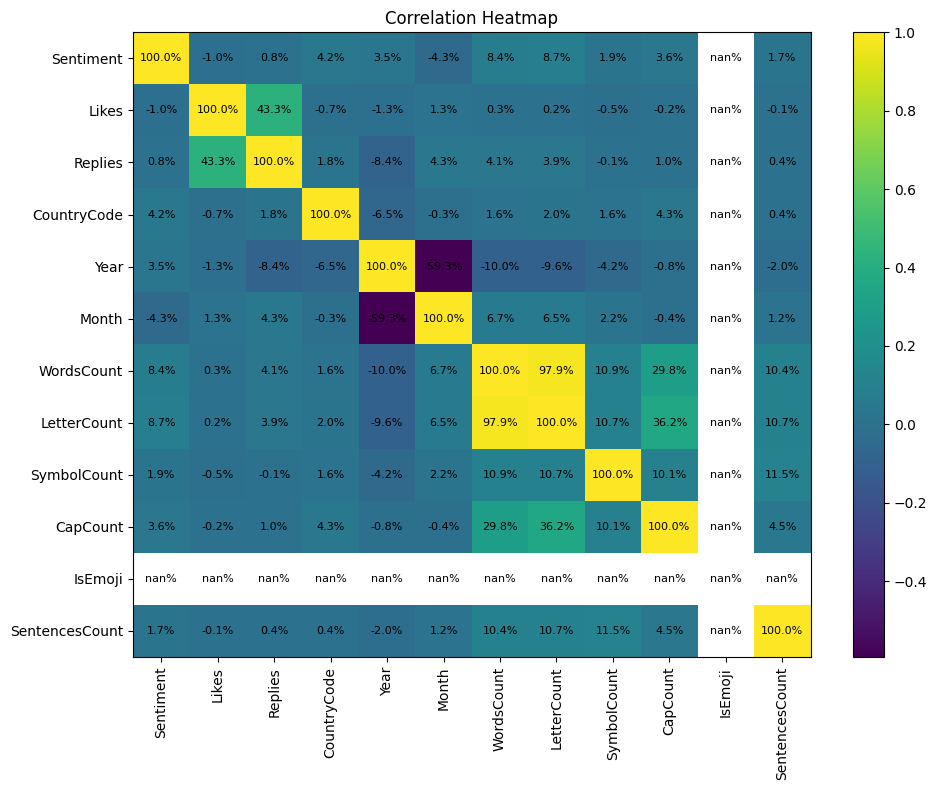

In [ ]:
new_df = df.copy()
for col in ['Sentiment', 'CountryCode']:
  eda_df[col], _ = pd.factorize(eda_df[col])
numeric_df = eda_df.select_dtypes(include=['float64', 'int64', 'int32'])
corr = numeric_df.corr()
plt.figure(figsize=(10, 8))
plt.imshow(corr, aspect='auto')
plt.colorbar()
plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
plt.yticks(range(len(corr.columns)), corr.columns)
for i in range(len(corr.columns)):
    for j in range(len(corr.columns)):
        plt.text(
            j, i,
            f"{corr.iloc[i, j]*100:.1f}%",
            ha="center",
            va="center",
            fontsize=8
        )
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

### חקירת comment text מחדש

לפני התהליך

(np.float64(-0.5), np.float64(1199.5), np.float64(799.5), np.float64(-0.5))

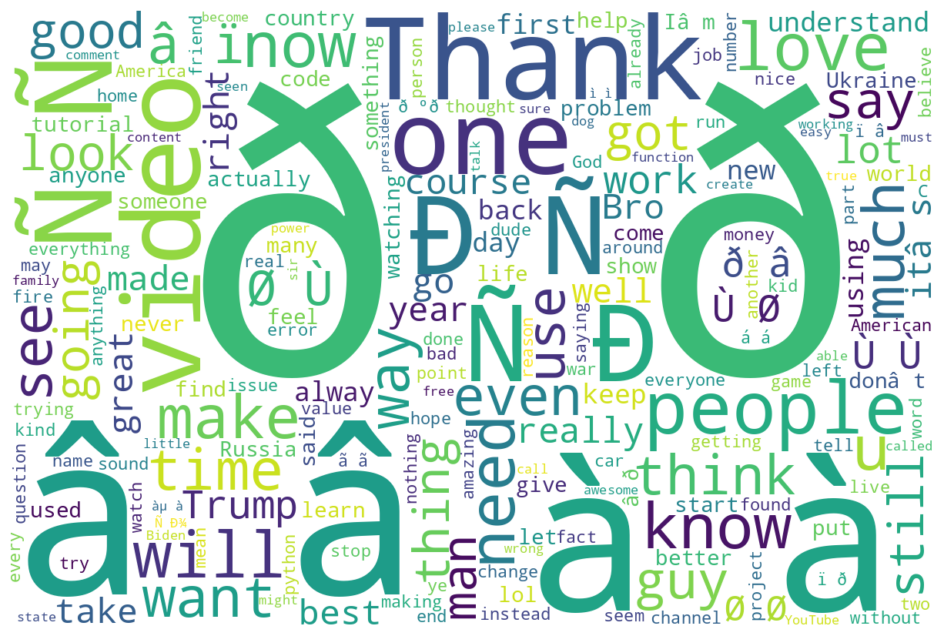

In [ ]:
text = " ".join(df["CommentText"].dropna().astype(str))
wordcloud = WordCloud(
    width=1200,
    height=800,
    background_color="white"
).generate(text)
plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")

אחרי התהליך

(np.float64(-0.5), np.float64(1199.5), np.float64(799.5), np.float64(-0.5))

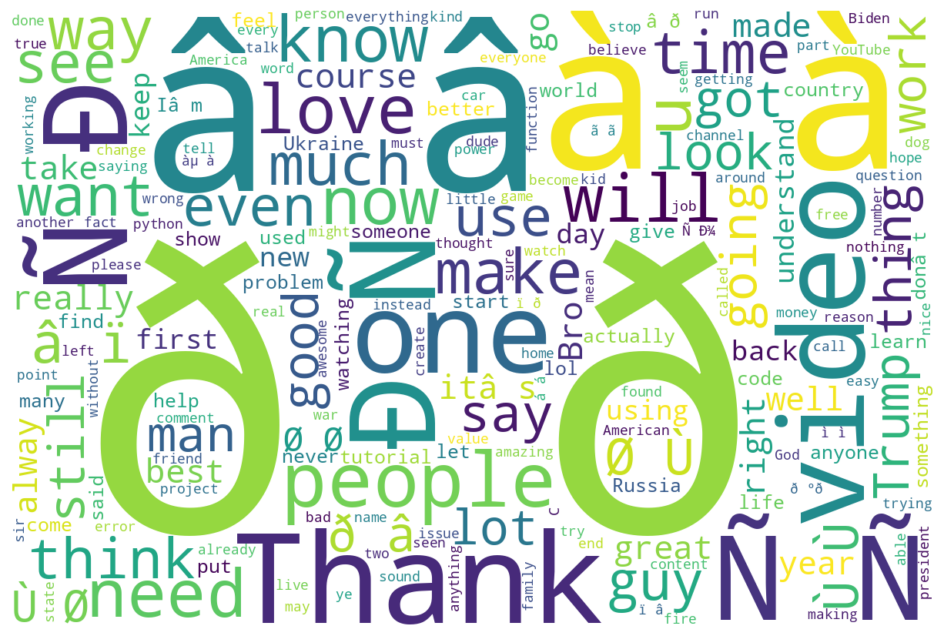

In [ ]:
text = " ".join(eda_df["CommentText"].dropna().astype(str))
wordcloud = WordCloud(
    width=1200,
    height=800,
    background_color="white"
).generate(text)
plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")

# Models

## MODEL - KNN

In [ ]:
import pandas as pd
import re
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import nltk

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def clean_text(t):
    t = str(t).lower()
    t = re.sub(r'[^\w\s]', ' ', t)
    words = t.split()
    words = [lemmatizer.lemmatize(w) for w in words if w not in stop_words]
    return ' '.join(words)

eda_df['CleanText'] = eda_df['CommentText'].apply(clean_text)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/tmp/ipykernel_396/2670594082.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eda_df['CleanText'] = eda_df['CommentText'].apply(clean_text)


In [ ]:
sample_df = eda_df.sample(
    n=50000,
    random_state=42
)

In [ ]:
#set up data for model
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from scipy.sparse import hstack
import numpy as np

text_col = 'CleanText'
numeric_cols = [
    'Likes', 'Replies', 'WordsCount', 'LetterCount',
    'SymbolCount', 'CapCount', 'IsEmoji', 'SentencesCount'
]
categorical_cols = ['Category', 'CountryCode']
sample_df[categorical_cols] = sample_df[categorical_cols].apply(lambda x: x.astype('category').cat.codes)

X_numeric = sample_df[numeric_cols + categorical_cols].values.astype(np.float32)

vectorizer = TfidfVectorizer(
    stop_words='english',
    ngram_range=(1,2),
    min_df=5,
    max_df=0.8,
    max_features=20000,
    sublinear_tf=True
)
X_text = vectorizer.fit_transform(sample_df[text_col])

In [ ]:
X = sample_df.drop(columns=['Sentiment', 'CommentText', 'CleanText'])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

In [ ]:
knn = KNeighborsClassifier(
    n_neighbors=5,
    metric='cosine'
)
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)

In [ ]:

recall_knn = recall_score(y_test, y_pred_knn, average='macro')
print("Recall (Macro):", recall_knn)
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print("Accuracy:", accuracy_knn)
precision_score_knn = precision_score(y_test, y_pred_knn, average='macro')
print("Precision (Macro):", precision_score_knn)
f1_score_knn = f1_score(y_test, y_pred_knn, average='macro')
print("F1 Score (Macro):", f1_score_knn)

Recall (Macro): 0.4380494914166258
Accuracy: 0.4376
Precision (Macro): 0.4459128634259337
F1 Score (Macro): 0.43768912805624005


In [ ]:
import pandas as pd
import re
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import nltk

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def clean_text(t):
    t = str(t).lower()
    t = re.sub(r'[^\w\s]', ' ', t)
    words = t.split()
    words = [lemmatizer.lemmatize(w) for w in words if w not in stop_words]
    return ' '.join(words)

eda_df['CleanText'] = eda_df['CommentText'].apply(clean_text)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/tmp/ipykernel_396/2670594082.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eda_df['CleanText'] = eda_df['CommentText'].apply(clean_text)


In [ ]:
!pip install emoji
import emoji


def emoji_to_text(text):
    return emoji.demojize(text)

eda_df['CleanText'] = eda_df['CleanText'].apply(emoji_to_text)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.4/608.4 kB 4.9 MB/s eta 0:00:00


/tmp/ipykernel_396/2341909251.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eda_df['CleanText'] = eda_df['CleanText'].apply(emoji_to_text)


In [ ]:
#סקילינג על הדאטה
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_numeric_scaled = scaler.fit_transform(sample_df[numeric_cols])


In [ ]:
#לחלק את הדאטה
X = hstack([X_text, X_numeric_scaled])
y = sample_df['Sentiment']

In [ ]:

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

In [ ]:

#מודל
knn = KNeighborsClassifier(n_neighbors=30, metric='cosine')
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.47      0.62      0.54      4948
           1       0.66      0.61      0.63      4974
           2       0.61      0.46      0.52      5078

    accuracy                           0.56     15000
   macro avg       0.58      0.56      0.56     15000
weighted avg       0.58      0.56      0.56     15000



neutral 0
positive 1
negative 2

In [ ]:
#קוד המגלה את הקומבינציות המביאות את ציון הf1 הטוב ביותר
from itertools import combinations
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import f1_score
import numpy as np

from sklearn.metrics import classification_report

def best_feature_combination(X, y, x, random_state=42):
    feature_names = list(X.columns)

    best_score = 0
    best_combo = None

    for combo in combinations(feature_names, x):
        X_subset = X[list(combo)].values.astype(np.float32)

        X_train, X_test, y_train, y_test = train_test_split(
            X_subset, y, test_size=0.2, random_state=random_state, stratify=y
        )

        knn = KNeighborsClassifier(n_neighbors=5, metric='cosine', weights='distance')
        knn.fit(X_train, y_train)
        y_pred = knn.predict(X_test)
        score = f1_score(y_test, y_pred, average='macro')

        print("the score between", combo,"is",score)

        if score > best_score:
            best_score = score
            best_combo = combo

    return best_combo, best_score


In [ ]:
features_df = sample_df[numeric_cols + categorical_cols]
best_columns, best_f1 = best_feature_combination(features_df, y, x=3)
print("Best combination:", best_columns)
print("Best F1 score:", best_f1)

the score between ('Likes', 'Replies', 'WordsCount') is 0.32179143077860584
the score between ('Likes', 'Replies', 'LetterCount') is 0.3165911135089538
the score between ('Likes', 'Replies', 'SymbolCount') is 0.33050857394553246
the score between ('Likes', 'Replies', 'CapCount') is 0.3308946185339296
the score between ('Likes', 'Replies', 'IsEmoji') is 0.24665958772863164
the score between ('Likes', 'Replies', 'SentencesCount') is 0.3578092855468998
the score between ('Likes', 'Replies', 'Category') is 0.346305046307466
the score between ('Likes', 'Replies', 'CountryCode') is 0.2637076534684283
the score between ('Likes', 'WordsCount', 'LetterCount') is 0.3801176360955716
the score between ('Likes', 'WordsCount', 'SymbolCount') is 0.3674823599024812
the score between ('Likes', 'WordsCount', 'CapCount') is 0.3742778339779613
the score between ('Likes', 'WordsCount', 'IsEmoji') is 0.33787744903627687
the score between ('Likes', 'WordsCount', 'SentencesCount') is 0.35319444827736346
the s

In [ ]:
# ניסיון BOW - BAG OF WORDS
vectorizer = CountVectorizer(
    lowercase=True,
    stop_words='english'
)
bow_x = vectorizer.fit_transform(sample_df['CommentText'])
bow_x

<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 434366 stored elements and shape (50000, 47992)>

In [ ]:
# ניסיון TF-IDF
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(
    lowercase=True,
    stop_words='english',
    ngram_range=(1, 2),     # unigrams + bigrams
    min_df=5,               # ignore very rare words
    max_df=0.8,             # ignore very common words
    max_features=20000,     # cap vocabulary size
    sublinear_tf=True       # log-scaled term frequency
)

tf_idf_x = vectorizer.fit_transform(sample_df['CleanText'])
tf_idf_x

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 412142 stored elements and shape (50000, 13938)>

In [ ]:
# דוגמית X- tfidf
y = sample_df['Sentiment']
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    tf_idf_x,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(
    n_neighbors=15,
    metric='cosine'
)

knn.fit(X_train, y_train)


KNeighborsClassifier(metric='cosine', n_neighbors=15)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
# דוגמית X- tfidf עם K - 15 מבחן - 0.2
y_pred = knn.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.46      0.58      0.51      3299
           1       0.61      0.62      0.62      3316
           2       0.61      0.45      0.52      3385

    accuracy                           0.55     10000
   macro avg       0.56      0.55      0.55     10000
weighted avg       0.56      0.55      0.55     10000

[[1920  775  604]
 [ 913 2054  349]
 [1339  532 1514]]


In [ ]:
#after standardisation
y = sample_df['Sentiment']
from sklearn.model_selection import train_test_split
tf_idf_x
X_train, X_test, y_train, y_test = train_test_split(
    tf_idf_x,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)
y_pred = knn.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.46      0.58      0.51      3299
           1       0.61      0.62      0.62      3316
           2       0.61      0.45      0.52      3385

    accuracy                           0.55     10000
   macro avg       0.56      0.55      0.55     10000
weighted avg       0.56      0.55      0.55     10000



In [ ]:
# יצירת w2v על המודל
sentences = sample_df['CleanText'].astype(str).str.split()
w2v_model = Word2Vec(
    sentences,
    vector_size=100,
    window=5,
    min_count=2,
    workers=4
)
def get_w2v_vector(tokens, model, vector_size):
    vectors = [
        model.wv[word]
        for word in tokens
        if word in model.wv
    ]
    if len(vectors) == 0:
        return np.zeros(vector_size)
    return np.mean(vectors, axis=0)
w2v_vectors = np.array([
    get_w2v_vector(text.split(), w2v_model, 100)
    for text in sample_df['CleanText']
])

In [ ]:
numeric_features = sample_df.select_dtypes(include=['float64', 'int64', 'int32']).drop(columns=['Sentiment'])
numeric_features

,Likes,Replies,Year,Month,WordsCount,LetterCount,SymbolCount,CapCount,IsEmoji,SentencesCount
226132,0,0,2025.0,2.0,31,120,0,8,0,2
124300,0,0,2025.0,2.0,57,302,0,28,0,4
134320,0,0,2025.0,2.0,4,14,1,1,0,1
262732,0,0,2020.0,8.0,6,25,0,1,0,0
234455,0,0,2025.0,1.0,9,35,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...
115885,0,0,2024.0,10.0,12,49,1,1,0,1
220467,0,0,2018.0,8.0,18,75,1,2,0,3
250054,7,0,2022.0,4.0,5,37,0,0,0,0
126133,2,0,2025.0,1.0,27,91,0,0,0,0


In [ ]:
# מורכב מ
X = np.hstack([
    w2v_vectors,
    numeric_features.values
])
y = sample_df['Sentiment']

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled

array([[-0.68299987,  0.49047149,  0.29449573, ...,  0.10309176,
         0.        ,  0.08679489],
       [-0.51581868,  0.01919184,  0.41825506, ...,  0.88063807,
         0.        ,  0.68562817],
       [-0.04990922, -0.81459373,  0.80689429, ..., -0.16904945,
         0.        , -0.21262174],
       ...,
       [ 0.33173763,  0.72485903, -1.36288648, ..., -0.20792677,
         0.        , -0.51203838],
       [ 1.2213515 ,  1.63936248, -0.3754479 , ..., -0.20792677,
         0.        , -0.51203838],
       [ 0.05000704, -1.07977416,  0.2460524 , ..., -0.13017214,
         0.        ,  0.08679489]])

In [ ]:
#ביצוע קרוס-ולידציה
knn = KNeighborsClassifier(
    n_neighbors=5,
    metric='cosine'
)

scores = cross_val_score(
    knn,
    X_scaled,
    y,
    cv=5,
    scoring='precision_macro'
)
scores

array([0.52096229, 0.52675321, 0.52432157, 0.52356248, 0.51622491])

In [ ]:
cross_val_score(knn, X, y, cv=5, scoring='recall_macro')

array([0.47800942, 0.47978676, 0.48436123, 0.47691111, 0.48119232])

In [ ]:
cross_val_score(knn, X, y, cv=5, scoring='f1_macro')

array([0.47848982, 0.48040481, 0.48493403, 0.47728397, 0.48140611])

In [ ]:
cross_val_score(knn, X, y, cv=5, scoring='accuracy')

array([0.4777, 0.4795, 0.484 , 0.4766, 0.4808])

In [ ]:
knn = KNeighborsClassifier(
    n_neighbors=7,
    weights='distance',
    metric='cosine'
)
scores = cross_val_score(
    knn,
    X_scaled,
    y,
    cv=5,
    scoring='f1_macro'
)
scores

array([0.53385394, 0.53804247, 0.53556525, 0.5368415 , 0.52377721])

In [ ]:
scores = cross_val_score(
    knn,
    X_scaled,
    y,
    cv=5,
    scoring='accuracy'
)
scores

array([0.5331, 0.5376, 0.5344, 0.5366, 0.5233])

In [ ]:
scores = cross_val_score(
    knn,
    X_scaled,
    y,
    cv=5,
    scoring='recall_macro'
)
scores

array([0.53285013, 0.53727069, 0.5341305 , 0.53630228, 0.52307344])

In [ ]:
scores = cross_val_score(
    knn,
    X_scaled,
    y,
    cv=5,
    scoring='f1_macro'
)
scores

array([0.53385394, 0.53804247, 0.53556525, 0.5368415 , 0.52377721])

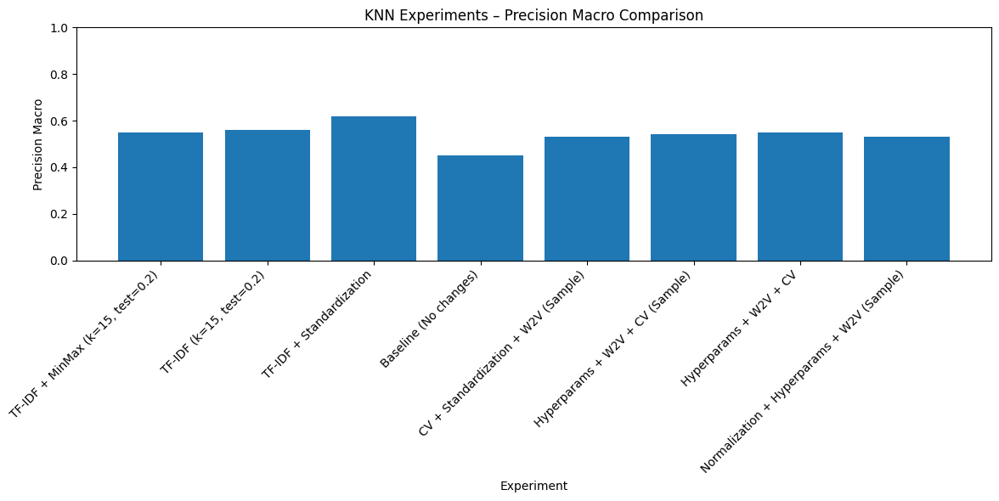

In [ ]:
results = pd.DataFrame({
    'Experiment': [
        'TF-IDF + MinMax (k=15, test=0.2)',
        'TF-IDF (k=15, test=0.2)',
        'TF-IDF + Standardization',
        'Baseline (No changes)',
        'CV + Standardization + W2V (Sample)',
        'Hyperparams + W2V + CV (Sample)',
        'Hyperparams + W2V + CV',
        'Normalization + Hyperparams + W2V (Sample)'
    ],
    'Precision_Macro': [
        0.55,
        0.56,
        0.62,
        0.45,
        0.53,
        0.54,
        0.55,
        0.53
    ]
})
plt.figure(figsize=(12, 6))
plt.bar(results['Experiment'], results['Precision_Macro'])
plt.xticks(rotation=45, ha='right')
plt.ylabel('Precision Macro')
plt.xlabel('Experiment')
plt.title('KNN Experiments – Precision Macro Comparison')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

##MODEL - Logistic Regression(LR)

In [ ]:
# אף שינוי מעבר לעמודות
X = sample_df.drop(columns=['Sentiment', 'CommentText', 'CleanText'])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.4237

0.4234120326052892

0.4218594769315294

0.4174750686222605

In [ ]:
# TF_IDF עם המודל ורק עמודת clean_text
X = tf_idf_x
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))


0.6238

0.6280459753507571

0.6237680648659912

0.6251561142641834

In [ ]:
# w2v ושאר העמודות
X = np.hstack([
    w2v_vectors,
    numeric_features.values
])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.5305

0.5306737267651682

0.5307903509470843

0.5296060137122436

In [ ]:
#TFIDF כל העמודות וביצוע מינמקס
X = hstack([X_text, X_numeric_scaled])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

0.6222

0.62643763636338

0.6221978834153613

0.6235568264783605

In [ ]:
#TFIDF כל העמודות
X = hstack([X_text, numeric_features.values])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.4187

0.42101705087341745

0.41778130852439976

0.4173008928574577

In [ ]:
# TFIDF, היפר פרמטרים, כל העמודות
lr = LogisticRegression(
    penalty='elasticnet',  # שילוב L1 וL2
    solver='saga',    # חובה בשימוש בelasticent, זה לומד משקלים
    C=1.0,   # מחליט על האיזון בין למידה חזקה ללמידה פשוטה
    l1_ratio=0.5,  # היחס בין L1 לL2
    class_weight='balanced',      # נותן יותר משקל לערכים נדירים שיהיה איזון
    max_iter=2000,
    n_jobs=-1,
    multi_class='multinomial' # היפר פרמטר שמטרתו היא לבצע סיווג רק מחלקתי בדרך שונה
)

lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
#היפר פרמטרים, w2v, כל העמודות
X = np.hstack([
    w2v_vectors,
    numeric_features.values
])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
lr = LogisticRegression(
    penalty='elasticnet',  # שילוב L1 וL2
    solver='saga',    # חובה בשימוש בelasticent, זה לומד משקלים
    C=1.0,   # מחליט על האיזון בין למידה חזקה ללמידה פשוטה
    l1_ratio=0.5,  # היחס בין L1 לL2
    class_weight='balanced',      # היפר פרמטר שמטרתו היא לבצע סיווג רק מחלקתי בדרך שונה
    max_iter=2000,
    n_jobs=-1,
    multi_class='multinomial' # היפר פרמטר
)

lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

In [ ]:
X = hstack([X_text, X_scaled])
y = sample_df['Sentiment']
lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))



KeyboardInterrupt: 

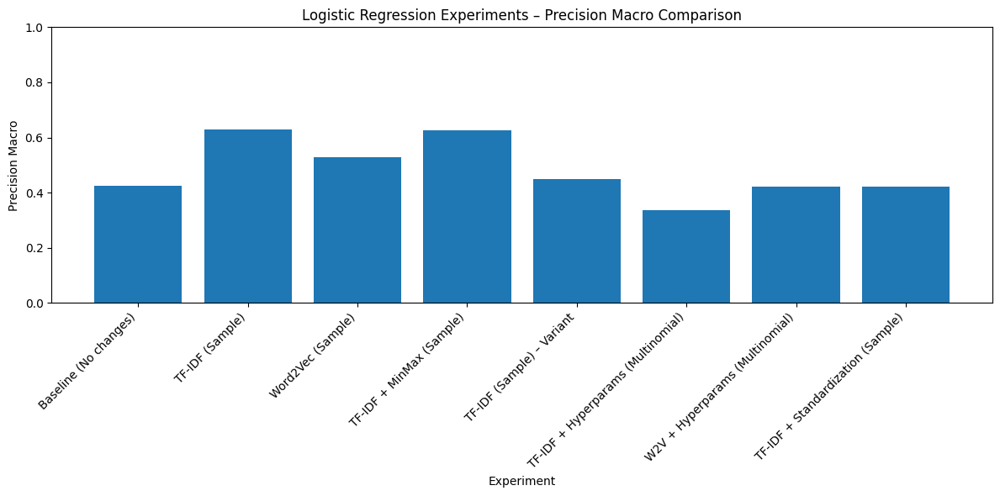

In [ ]:
results_lr = pd.DataFrame({
    'Experiment': [
        'Baseline (No changes)',
        'TF-IDF (Sample)',
        'Word2Vec (Sample)',
        'TF-IDF + MinMax (Sample)',
        'TF-IDF (Sample) – Variant',
        'TF-IDF + Hyperparams (Multinomial)',
        'W2V + Hyperparams (Multinomial)',
        'TF-IDF + Standardization (Sample)'
    ],
    'Precision_Macro': [
        0.424,
        0.628,
        0.528,
        0.625,
        0.448,
        0.338,
        0.423,
        0.423
    ]
})
plt.figure(figsize=(12, 6))
plt.bar(results_lr['Experiment'], results_lr['Precision_Macro'])
plt.xticks(rotation=45, ha='right')
plt.ylabel('Precision Macro')
plt.xlabel('Experiment')
plt.title('Logistic Regression Experiments – Precision Macro Comparison')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

  ## MODEL - SVM

In [ ]:
# הכל רגיל
X = sample_df.drop(columns=['Sentiment', 'CommentText', 'CleanText'])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=42)
svm = LinearSVC(class_weight='balanced', max_iter=3000)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

0.4214

0.42147456808754796

0.41940053089364443

0.41389778641522845

In [ ]:
# TFIDF וסטנדרטיזציה
X = hstack([X_text, X_scaled])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=42)
svm = LinearSVC(class_weight='balanced', max_iter=3000)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


0.6161

0.6170693028148324

0.6165779862081965

0.6167999056498698

In [ ]:
# w2v ושאר העמודות
X = np.hstack([
    w2v_vectors,
    numeric_features.values
])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
svm = LinearSVC(class_weight='balanced', max_iter=3000)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

0.5497

0.5507528447494604

0.549813309881074

0.5475161498495823

In [ ]:
#TFIDF
X = hstack([X_text, numeric_features.values])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
svm = LinearSVC(class_weight='balanced', max_iter=3000)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

0.6

0.6105848257557045

0.5983009956589945

0.5980510922298519

In [ ]:
#TFIDF כל העמודות וביצוע מינמקס
X = hstack([X_text, X_numeric_scaled])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
svm = LinearSVC(class_weight='balanced', max_iter=3000)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

0.6037

0.6057868204920469

0.6039890889201543

0.6047033331308178

In [ ]:
#W2V כל העמודות וביצוע מינמקס
X = np.hstack([w2v_vectors, X_numeric_scaled])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
svm = LinearSVC(class_weight='balanced', max_iter=3000)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

0.5582

0.5612132347568296

0.5581035561190114

0.5580123827517453

In [ ]:
# tf_idf ורק עמודת הטקסט
X = tf_idf_x
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
svm = LinearSVC(class_weight='balanced', max_iter=3000)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

0.6033

0.6051549816217242

0.6036023264945299

0.6042363365394802

In [ ]:
# w2v ורק עמודת הטקסט
X = w2v_vectors
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
svm = LinearSVC(class_weight='balanced', max_iter=3000)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

0.5563

0.5593510052095105

0.5560252286182977

0.5550766011324696

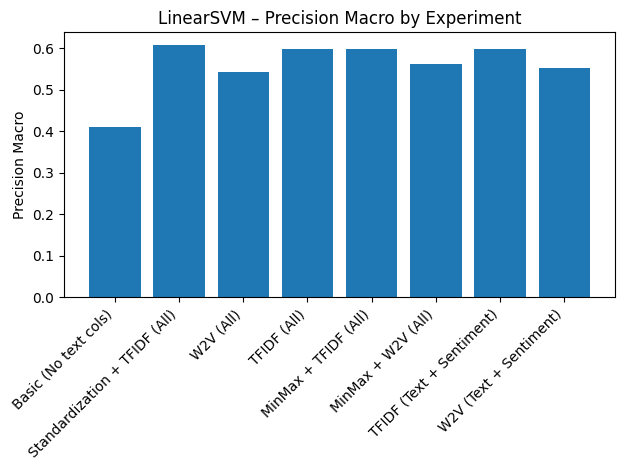

In [ ]:
# גרף סיגום להצגת כל הוריאציות והציונים
experiments = [
    "Basic (No text cols)",
    "Standardization + TFIDF (All)",
    "W2V (All)",
    "TFIDF (All)",
    "MinMax + TFIDF (All)",
    "MinMax + W2V (All)",
    "TFIDF (Text + Sentiment)",
    "W2V (Text + Sentiment)"
]

precision_macro = [
    0.41,
    0.608,
    0.544,
    0.598,
    0.598,
    0.561,
    0.598,
    0.552
]

plt.figure()
plt.bar(experiments, precision_macro)
plt.xticks(rotation=45, ha='right')
plt.ylabel("Precision Macro")
plt.title("LinearSVM – Precision Macro by Experiment")
plt.tight_layout()
plt.show()

## מודל נבחר - LR

In [ ]:
# X_numeric_scaled - מינמקס
# X_text - TFIDF

In [ ]:
#TFIDF כל העמודות וביצוע מינמקס
X = hstack([X_text, X_numeric_scaled])
y = sample_df['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
display(accuracy_score(y_test, y_pred))
display(precision_score(y_test, y_pred, average='macro'))
display(recall_score(y_test, y_pred, average='macro'))
display(f1_score(y_test, y_pred, average='macro'))

0.6222

0.62643763636338

0.6221978834153613

0.6235568264783605

In [ ]:
# הוספת קרוס ולידציה למודל
model = LogisticRegression(max_iter=1000)
cv_scores = cross_val_score(
    model,
    X,
    y,
    cv=5,
    scoring='precision_macro'
)
print("CV Precision Macro scores:", cv_scores)
print("Mean Precision Macro:", cv_scores.mean())

CV Precision Macro scores: [0.62833436 0.62489421 0.63236196 0.62552544 0.63331645]
Mean Precision Macro: 0.6288864835315804


In [ ]:
sample_df['Year'].value_counts()
#טווח הערכים נע בין 2013- 2025

,count
Year,
2025.0,29571
2022.0,5630
2024.0,4868
2021.0,2790
2020.0,2535
2023.0,2399
2019.0,1136
2018.0,543
2017.0,302


In [ ]:
# אימון על שנים 2013-2019
#בדיקה על שנים 2020-2025
train_years = list(range(2013, 2020))  # 2013–2019
test_years  = list(range(2020, 2026))  # 2020–2025

train_df = sample_df[sample_df['Year'].isin(train_years)]
test_df  = sample_df[sample_df['Year'].isin(test_years)]


In [ ]:
common_rows = pd.merge(train_df, test_df, how='inner') # בדיקה האם יש שורות משותפות באמצעות merge
len(common_rows)

0

In [ ]:
#TFIDF על הנתונים
tfidf = TfidfVectorizer(
    max_features=50000,
    stop_words='english'
)
X_text_train = tfidf.fit_transform(train_df['CleanText'])
X_text_test  = tfidf.transform(test_df['CleanText'])

In [ ]:
# MINMAX על העמודות המספריות
numeric_cols = train_df.drop(columns=['Sentiment', 'CommentText', 'CleanText']).columns
scaler = MinMaxScaler()
X_num_train = scaler.fit_transform(train_df[numeric_cols])
X_num_test  = scaler.transform(test_df[numeric_cols])

In [ ]:
 # ויצרית הסטים חיבור הנתונים
X_train = hstack([X_text_train, X_num_train])
X_test  = hstack([X_text_test,  X_num_test])
y_train = train_df['Sentiment']
y_test  = test_df['Sentiment']

In [ ]:
#שלב האימון אחד לאימון אחד למבחן
model = LogisticRegression(
    max_iter=1000,
    class_weight='balanced'
)
model.fit(X_train, y_train)

# תחזיות
y_pred_train = model.predict(X_train)
y_pred_test  = model.predict(X_test)

# דיוק על TRAIN
print("Train Precision Macro:",
      precision_score(y_train, y_pred_train, average='macro'))

# דיוק על TEST
print("Test Precision Macro:",
      precision_score(y_test, y_pred_test, average='macro'))

Train Precision Macro: 0.8790976966159448
Test Precision Macro: 0.5575954461258186


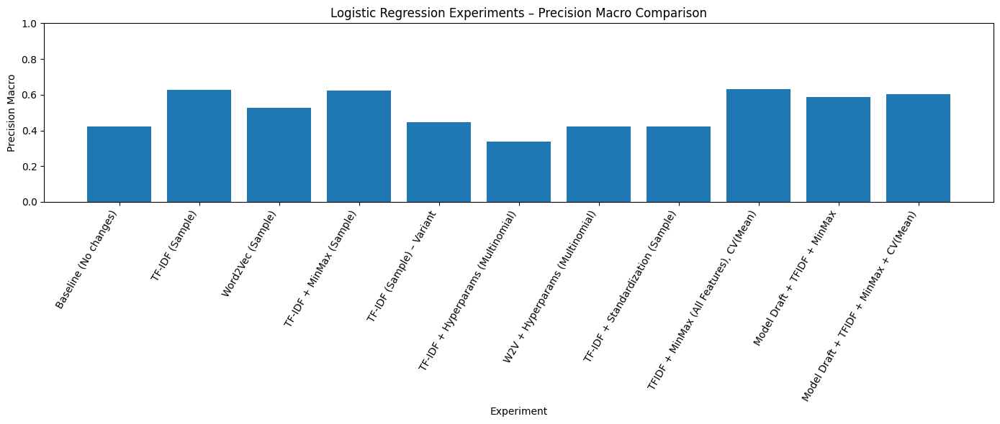

In [ ]:
# גרף שמציג את הציונים presicion הכי גבוהים והוריאציות
# טבלת תוצאות ניסויי LR (מעודכן)
results_lr = pd.DataFrame({
    'Experiment': [
        'Baseline (No changes)',
        'TF-IDF (Sample)',
        'Word2Vec (Sample)',
        'TF-IDF + MinMax (Sample)',
        'TF-IDF (Sample) – Variant',
        'TF-IDF + Hyperparams (Multinomial)',
        'W2V + Hyperparams (Multinomial)',
        'TF-IDF + Standardization (Sample)',
        'TFIDF + MinMax (All Features), CV(Mean)',
        'Model Draft + TFIDF + MinMax',
        'Model Draft + TFIDF + MinMax + CV(Mean)'
    ],
    'Precision_Macro': [
        0.424,
        0.628,
        0.528,
        0.625,
        0.448,
        0.338,
        0.423,
        0.423,
        0.632,
        0.588,
        0.605
    ]
})
plt.figure(figsize=(14, 6))
plt.bar(results_lr['Experiment'], results_lr['Precision_Macro'])
plt.xticks(rotation=60, ha='right')
plt.ylabel('Precision Macro')
plt.xlabel('Experiment')
plt.title('Logistic Regression Experiments – Precision Macro Comparison')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

## בדיקת פיצ'רים לאחר כישלון המודל

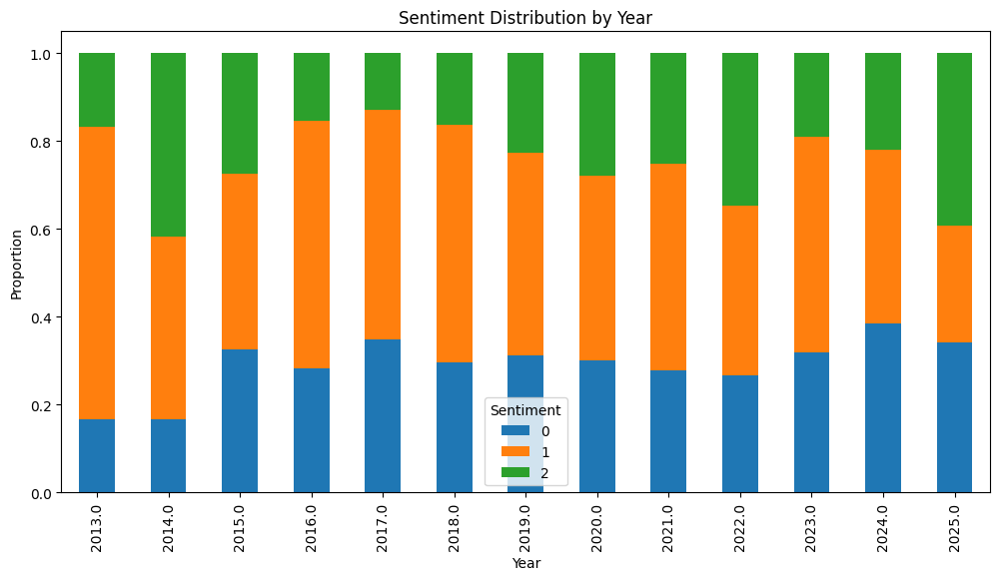

In [ ]:
#התפלגות לפי שנה
sentiment_by_year = sample_df.groupby('Year')['Sentiment'].value_counts(normalize=True).unstack()
sentiment_by_year.plot(kind='bar', stacked=True, figsize=(12,6))
plt.title("Sentiment Distribution by Year")
plt.ylabel("Proportion")
plt.xlabel("Year")
plt.show()

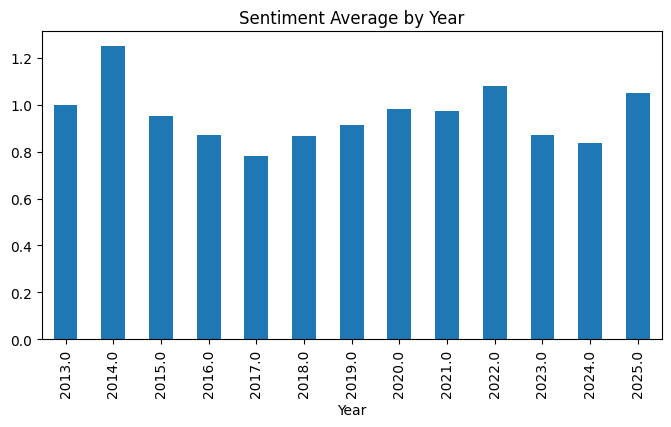

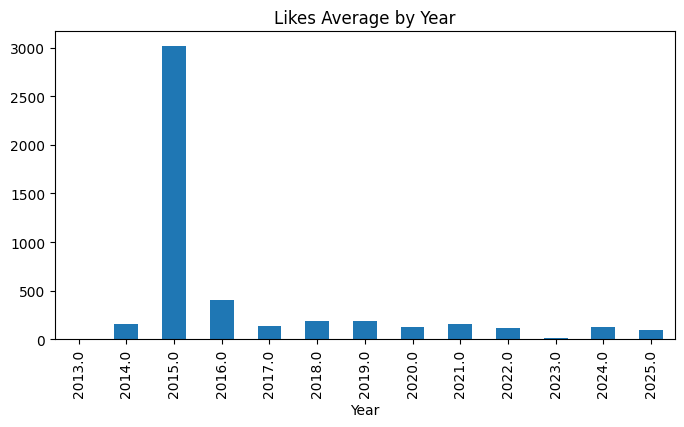

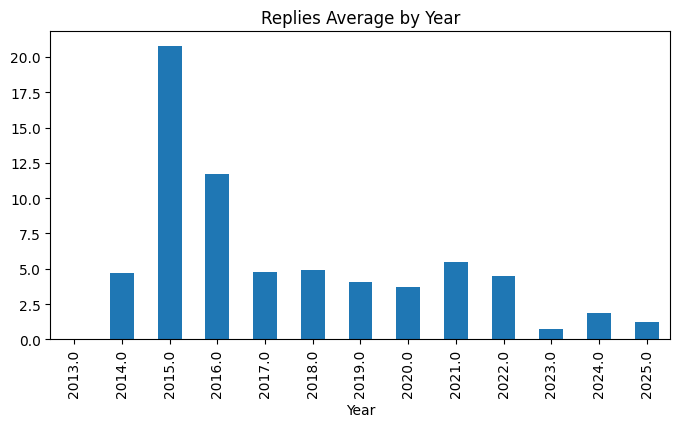

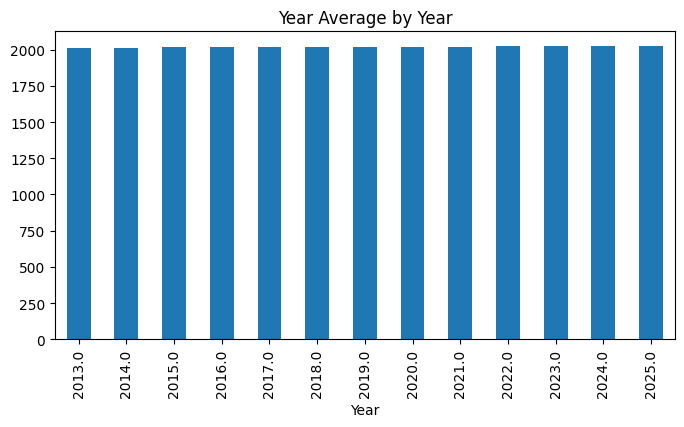

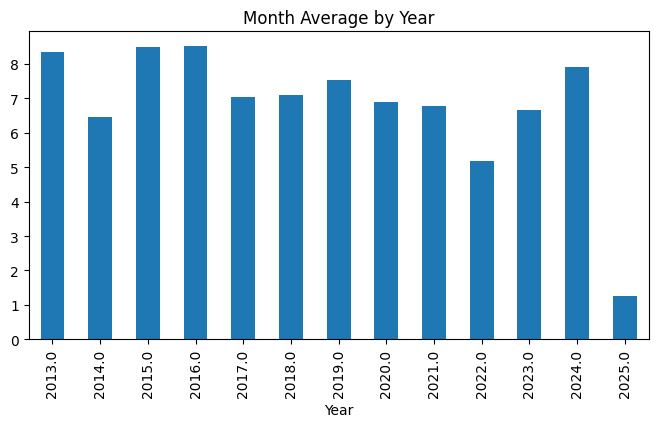

...

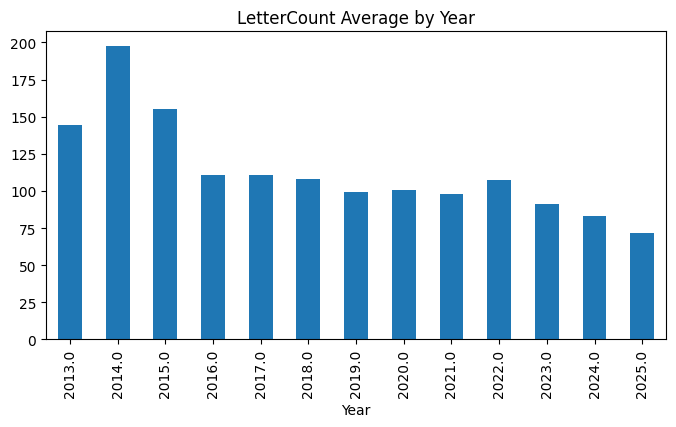

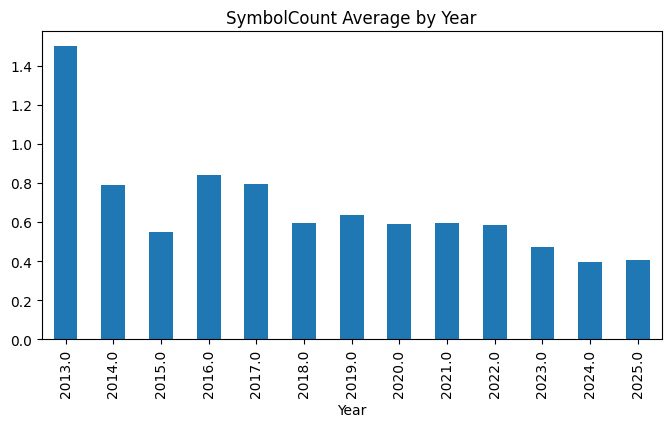

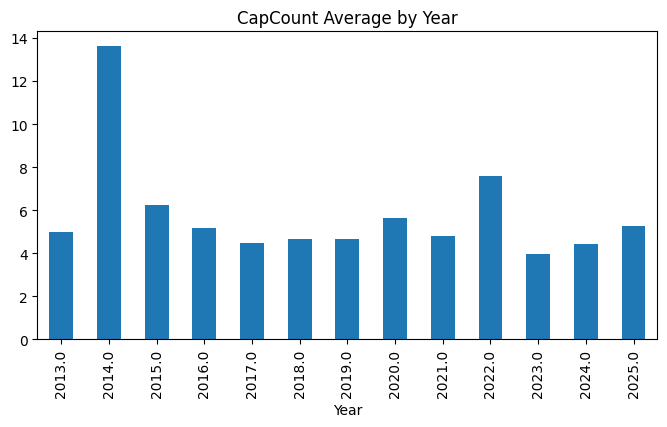

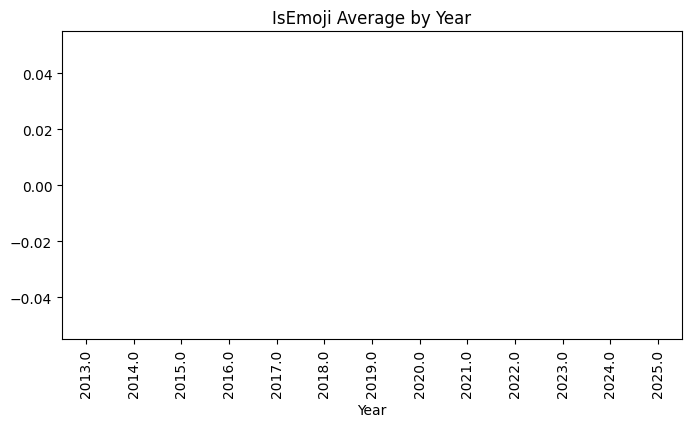

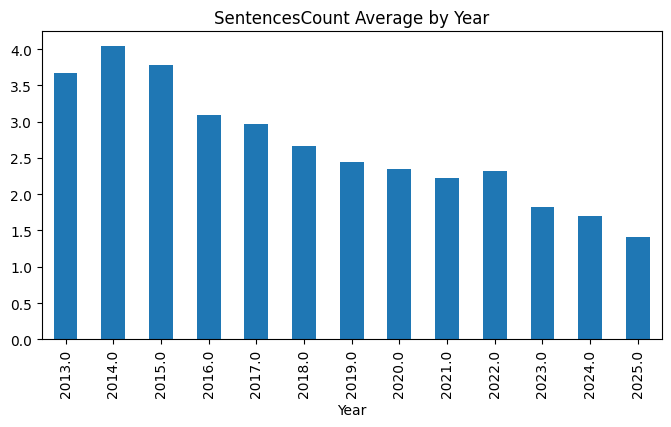

In [ ]:
#פיצרים מספריים מול השנים
numeric_cols = sample_df.select_dtypes(include=['int64','float64']).columns
for col in numeric_cols:
    plt.figure(figsize=(8,4))
    sample_df.groupby('Year')[col].mean().plot(kind='bar')
    plt.title(f"{col} Average by Year")
    plt.show()

In [ ]:
# בדיקת קורלציה
corr = train_df.corr(numeric_only=True)
year_corr = corr['Year'].sort_values(ascending=False)
print(year_corr)

Year              1.000000
Sentiment         0.012567
CountryCode       0.007544
Month            -0.018535
SymbolCount      -0.044519
CapCount         -0.056585
Replies          -0.066911
Category         -0.069365
Likes            -0.074894
LetterCount      -0.082085
WordsCount       -0.086322
SentencesCount   -0.091818
IsEmoji                NaN
Name: Year, dtype: float64


In [ ]:
# בדיקת הממוצע, חציון ותקן לפיצרים בזמן
numeric_cols = train_df.select_dtypes(include=['number']).columns
train_num = train_df[numeric_cols]
test_num  = test_df[numeric_cols]
comparison = pd.DataFrame({
    "train_mean": train_num.mean(),
    "test_mean": test_num.mean(),
    "train_median": train_num.median(),
    "test_median": test_num.median(),
    "train_std": train_num.std(),
    "test_std": test_num.std()
})
print(comparison)

                 train_mean    test_mean  train_median  test_median  \
Sentiment          0.886271     1.014354           1.0          1.0   
Likes            247.350702   101.029439           3.0          0.0   
Replies            5.223833     2.020547           0.0          0.0   
CountryCode        3.521069     3.705124           3.0          3.0   
Year            2018.125057  2023.945641        2019.0       2025.0   
Month              7.444948     3.285335           8.0          2.0   
Category           3.199819     4.528885           1.0          6.0   
WordsCount        24.484368    18.628983          16.0         12.0   
LetterCount      105.864069    81.189212          69.0         50.0   
SymbolCount        0.664703     0.449940           0.0          0.0   
CapCount           4.800181     5.373590           3.0          2.0   
IsEmoji            0.000000     0.000000           0.0          0.0   
SentencesCount     2.657000     1.666395           2.0          1.0   

     

In [ ]:
# בדיקת אחוזי השינוי בין הסט מבחן לסט אימון
comparison["mean_diff_%"] = (
    abs(comparison["train_mean"] - comparison["test_mean"])
    / (abs(comparison["train_mean"]) + 1e-6)
) * 100
comparison = comparison.sort_values("mean_diff_%", ascending=False)
print(comparison)

                 train_mean    test_mean  train_median  test_median  \
Replies            5.223833     2.020547           0.0          0.0   
Likes            247.350702   101.029439           3.0          0.0   
Month              7.444948     3.285335           8.0          2.0   
Category           3.199819     4.528885           1.0          6.0   
SentencesCount     2.657000     1.666395           2.0          1.0   
SymbolCount        0.664703     0.449940           0.0          0.0   
WordsCount        24.484368    18.628983          16.0         12.0   
LetterCount      105.864069    81.189212          69.0         50.0   
Sentiment          0.886271     1.014354           1.0          1.0   
CapCount           4.800181     5.373590           3.0          2.0   
CountryCode        3.521069     3.705124           3.0          3.0   
Year            2018.125057  2023.945641        2019.0       2025.0   
IsEmoji            0.000000     0.000000           0.0          0.0   

     

In [ ]:
problem_features = comparison[comparison["mean_diff_%"] > 40]

print(problem_features)
# יוצא מכאן שהפיצרים הבעייתים הם: replies, Month, Likes


          train_mean   test_mean  train_median  test_median    train_std  \
Replies     5.223833    2.020547           0.0          0.0    28.497788   
Likes     247.350702  101.029439           3.0          0.0  2082.365367   
Month       7.444948    3.285335           8.0          2.0     3.332378   
Category    3.199819    4.528885           1.0          6.0     2.482475   

             test_std  mean_diff_%  
Replies     15.085260    61.320596  
Likes     1553.757507    59.155386  
Month        3.403495    55.871616  
Category     3.012620    41.535659  


## בדיקת שיטה מחודשת

לאחר בדיקה התברר שהפיצרים עם האחוז שינוי הגבוה ביותר(שמעל 30) הם  replies, Month, Likes
לכן נסיר אותם מהמודל וננסה לבחון מחדש

In [ ]:
# יצירת משתנה שיחזיק בעמודות שצריך להוציא
removed_cols = train_df.drop(columns=[
    'Sentiment',
    'CommentText',
    'CleanText',
    'Replies',
    'Month',
    'Likes'
]).columns

In [ ]:
# MinMax על הפיצ'רים המספריים
scaler = MinMaxScaler()
X_num_train = scaler.fit_transform(train_df[removed_cols])
X_num_test  = scaler.transform(test_df[removed_cols])

In [ ]:
# חיבור הפיצרים לסטים סופיים
X_train = hstack([X_text_train, X_num_train])
X_test  = hstack([X_text_test,  X_num_test])

כעת לאחר שיש מחדש סטים סופיים הגיע זמן האימון הסופי

In [ ]:
# האימון
model = LogisticRegression(
    max_iter=1000,
    class_weight='balanced'
)
model.fit(X_train, y_train)

# תחזיות
y_pred_train = model.predict(X_train)
y_pred_test  = model.predict(X_test)

# דיוק על TRAIN
print("Train Precision Macro:",
      precision_score(y_train, y_pred_train, average='macro'))

# דיוק על TEST
print("Test Precision Macro:",
      precision_score(y_test, y_pred_test, average='macro'))

Train Precision Macro: 0.8772950212608718
Test Precision Macro: 0.5593903914586115
